<a href="https://colab.research.google.com/github/fcastellanosp/MINE-4206_202410_AML/blob/main/Talleres/Taller%203/Taller%203.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Challenge Técnico**

 ## **Candidato:** Danilo Andrés Alfonso Bohórquez

# **Problemática: La Falsificación de Productos en Marketplaces como Mercado Libre**

La venta de productos falsificados en marketplaces digitales representa un problema creciente que afecta a consumidores, vendedores legítimos y las propias plataformas de comercio electrónico. En marketplaces como **Mercado Libre**, donde la oferta es vasta y los vendedores pueden operar con relativa facilidad, se ha vuelto común la comercialización de productos que imitan marcas reconocidas, pero que no cumplen con los estándares de calidad ni con los derechos de propiedad intelectual.

## **Impacto de la falsificación**

### **1. Para los consumidores**  
- Pueden ser engañados al comprar productos que parecen auténticos pero que son de menor calidad o incluso peligrosos (ej. medicamentos, cosméticos o electrónicos).  
- En algunos casos, la compra de estos productos puede generar riesgos para la salud o la seguridad.  
- La dificultad para obtener reembolsos o garantías al descubrir que el producto es falso.  

### **2. Para los vendedores legítimos y marcas**  
- Reducción de ventas debido a la competencia desleal de productos falsificados.  
- Daño a la reputación de sus productos y marcas.  
- Pérdidas económicas derivadas de la falta de control sobre su propiedad intelectual.  

### **3. Para el marketplace**  
- Pérdida de confianza por parte de los compradores en la plataforma.  
- Riesgo de enfrentar problemas legales y sanciones por la venta de productos falsificados.  
- Incremento en los costos operativos para implementar sistemas de verificación y eliminación de falsificaciones.  

## **Desafíos en la solución del problema**  
A pesar de los esfuerzos de los marketplaces para implementar sistemas de verificación y denuncias, los falsificadores siguen encontrando formas de eludir los controles. Esto hace que el problema persista y evolucione constantemente, requiriendo mejores estrategias de detección, regulaciones más estrictas y una mayor educación del consumidor sobre cómo identificar productos falsificados.

---

## ¿Cómo vamos a abordar este problema?

Dado que la mayoría de las moderaciones están relacionadas con factores de precio y, en menor medida, con atributos específicos del producto, hemos decidido abordar este problema analizando si es posible identificar la falsificación de un producto utilizando únicamente su descripción y precio. Nuestro objetivo es determinar si estos dos parámetros son suficientes para diferenciar entre productos legítimos y falsificados.

**Para ello, implementaremos dos enfoques complementarios:**

- **Análisis de Clusterización:**
Exploraremos si los productos de las 10 categorías más representadas en nuestro dataset pueden ser diferenciados de manera efectiva en función de su legitimidad (Legítimo vs. Falso) mediante técnicas de clusterización lineal y no lineal.

- **Modelo TF-IDF con Redes Neuronales:**
Desarrollaremos un modelo basado en TF-IDF combinado con una red neuronal para evaluar hasta qué punto podemos lograr una identificación precisa de los productos, tanto a nivel de categoría como en su estatus de legitimidad.

**Nota Importante:**

Debido a que el dataset incluye productos comercializados en Brasil, donde las descripciones están en portugués, hemos decidido excluir estos productos del análisis para evitar sesgos lingüísticos. Por lo tanto, solo trabajaremos con productos de los siguientes países: Argentina, México, Colombia, Chile y Perú.

Este enfoque nos permitirá entender si la combinación de precio y descripción es suficiente para identificar productos falsificados o si es necesario incorporar variables adicionales en el proceso de detección.

### 1. Importación de paquetes y librerías.

In [ ]:
!pip install contractions

In [ ]:
!pip install polyglot

In [ ]:
!pip install pycld2
!pip install Morfessor

In [ ]:
!pip install pyicu

In [ ]:
!pip install --upgrade tensorflow

In [ ]:
!pip install -q -U keras-tuner

In [ ]:
# Manejo de datos
import pandas as pd
import numpy as np

# Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Entrenamiento del modelo y evaluación
import sklearn
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# Preprocesamiento de texto
import contractions
import inflect
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from sklearn.decomposition import TruncatedSVD
import re, string, unicodedata
from imblearn.over_sampling import SMOTE

# Nube de palabras
from wordcloud import WordCloud

# Tensorflow y keras para modelado y optimización
import tensorflow as tf
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.regularizers import l2
from keras.utils import plot_model
import keras_tuner as kt
from tensorflow.keras.optimizers import Adam
from sklearn.utils import resample

# Sistema operativo y utilidades
import os
import itertools
from datetime import datetime


print(f"La versión de sklearn es: {sklearn.__version__}")
print(f'La versión de Tensor Flow es:', tf.__version__)

La versión de sklearn es: 1.6.1
La versión de Tensor Flow es: 2.18.0


In [ ]:
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_r

True

In [ ]:
#Porcentaje para validación y test
test_alpha = 0.2
#random_state o semilla para la reproducibilidad
my_seed = 15

#### 1.1 Lectura del dataset

In [ ]:
df_t = pd.read_csv('data_moderaciones.csv', encoding='latin1', delimiter=';')

In [ ]:
df_t.shape

(40372, 15)

In [ ]:
df_t.head()

,element_id,site_id,seller_id,Dominio_normalizado,Titulo,Marca,Precio,Rule,Score,Total,Moderado,Fake,Rollback,FK_TEST1,FK_TEST2
0,ARG1000130348,ARGENTINA,924394736,COMPUTER_PROCESSORS,Microprocesador Intel Core I3 12100 12mb Bx807...,Intel,"222.599,00",NaN,"0,11000",1,"0,00","0,00",0,0,0
1,ARG1002056504,ARGENTINA,60385780,COMPUTER_MONITORS,Monitor Gamer Samsung Con Pantalla De 25 60hz...,Samsung,"767.000,00",NaN,"0,29000",1,"0,00","0,00",0,0,0
2,ARG1002630435,ARGENTINA,1085316688,SUNGLASSES,Anteojos De Sol Polarizados Ray-ban Erika Clas...,Ray-Ban,"246.510,00",NaN,"0,51000",1,"0,00","0,00",0,0,0
3,ARG1003499360,ARGENTINA,189266308,HARD_DRIVES_AND_SSDS,Ssd Externo Kingston Xs1000 1tb Negro Usb 3.2 ...,Kingston,"179.999,00",NaN,"0,32000",1,"0,00","0,00",0,0,0
4,ARG1004623658,ARGENTINA,127503700,RAM_MEMORY_MODULES,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...,Kingston,"22.399,00",NaN,"0,8",1,"0,00","0,00",0,0,0


### 1.2 Listado de las 10 categorias a trabajar

In [ ]:
# Lista de dominios a filtrar
dominios_filtrar = [
    "CELLPHONES", "WRISTWATCHES", "PERFUMES", "HEADPHONES",
    "NOTEBOOKS", "MEMORY_CARDS", "SPEAKERS", "INK_CARTRIDGES",
    "SUNGLASSES", "RAM_MEMORY_MODULES"
]

# Filtrar el DataFrame por los dominios específicos
df = df_t[df_t['Dominio_normalizado'].str.split().str[0].isin(dominios_filtrar)]



### 1.3 Exclusión de Brasil en el proceso

In [ ]:
df=df[df['site_id']!='BRASIL']

In [ ]:
df.shape

(19633, 15)

Utilizamos la unidad de medida de cada una de las monedad de los 5 países de latinoamérica sujestos al análisis con el fin de que cuando concatenemos el precio podamos tener una descripción real y asertada dependiendo del país

In [ ]:
# Diccionario de monedas por país
monedas = {
    'ARGENTINA': 'ARS',
    'COLOMBIA': 'COP',
    'MEXICO': 'MXN',
    'CHILE': 'CLP',
    'PERU': 'PEN'
}


df['Titulo_Precio'] = df.apply(
    lambda row: f"{row['Titulo']} por {row['Precio']} {monedas.get(row['site_id'], 'USD')}", axis=1
)

# Crear la columna con la categoría modificada dependiendo de si es falso o legítimo
df['Categoria_Fake'] = df.apply(
    lambda row: f"{row['Dominio_normalizado']}_FALSO" if row['Fake'] == '1,00' else f"{row['Dominio_normalizado']}_LEGITIMO", axis=1
)

df.head(10)


,element_id,site_id,seller_id,Dominio_normalizado,Titulo,Marca,Precio,Rule,Score,Total,Moderado,Fake,Rollback,FK_TEST1,FK_TEST2,Titulo_Precio,Categoria_Fake
2,ARG1002630435,ARGENTINA,1085316688,SUNGLASSES,Anteojos De Sol Polarizados Ray-ban Erika Clas...,Ray-Ban,"246.510,00",NaN,"0,51000",1,"0,00","0,00",0,0,0,Anteojos De Sol Polarizados Ray-ban Erika Clas...,SUNGLASSES_LEGITIMO
4,ARG1004623658,ARGENTINA,127503700,RAM_MEMORY_MODULES,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...,Kingston,"22.399,00",NaN,"0,8",1,"0,00","0,00",0,0,0,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...,RAM_MEMORY_MODULES_LEGITIMO
8,ARG1006111558,ARGENTINA,656166228,SPEAKERS,Parlante Xiaomi Sound Outdoor Mdz-38-db Portát...,Xiaomi,"86.249,50",FK_PRICE,"0,91",1,"1,00","1,00",0,0,0,Parlante Xiaomi Sound Outdoor Mdz-38-db Portát...,SPEAKERS_FALSO
10,ARG1007526165,ARGENTINA,127503700,NOTEBOOKS,Notebook Lenovo V15 Intel Core I3-1215u 24 Gb ...,Lenovo,"1.352.999,00",NaN,"0,03000",1,"0,00","0,00",0,0,0,Notebook Lenovo V15 Intel Core I3-1215u 24 Gb ...,NOTEBOOKS_LEGITIMO
11,ARG100795591,ARGENTINA,526594116,NOTEBOOKS,Notebook Lenovo V15 G3 Iap Intel Core I7-1255u...,Lenovo,"2.506.199,00",NaN,"0,09000",1,"0,00","0,00",0,0,0,Notebook Lenovo V15 G3 Iap Intel Core I7-1255u...,NOTEBOOKS_LEGITIMO
13,ARG1009131693,ARGENTINA,418387936,RAM_MEMORY_MODULES,Memoria Ram Ddr5 16gb 4800mhz 1x16gb Kingston ...,Kingston,"77.999,00",NaN,"0,32000",1,"0,00","0,00",0,0,0,Memoria Ram Ddr5 16gb 4800mhz 1x16gb Kingston ...,RAM_MEMORY_MODULES_LEGITIMO
15,ARG1010564464,ARGENTINA,127503700,NOTEBOOKS,Notebook Lenovo V15 G4 Ryzen 5 Ram 16gb Ssd 51...,Lenovo,"1.510.499,00",NaN,"0,07000",1,"0,00","0,00",0,0,0,Notebook Lenovo V15 G4 Ryzen 5 Ram 16gb Ssd 51...,NOTEBOOKS_LEGITIMO
16,ARG1012270700,ARGENTINA,924613112,CELLPHONES,Samsung Galaxy A15 128 Gb Azul Claro 4 Gb Ram,Samsung,"699.999,00",NaN,"0,01000",1,"0,00","0,00",0,0,0,Samsung Galaxy A15 128 Gb Azul Claro 4 Gb Ram ...,CELLPHONES_LEGITIMO
18,ARG1013746459,ARGENTINA,526594116,NOTEBOOKS,Notebook Lenovo V15 G3 Iap Intel Core I7-1255u...,Lenovo,"1.525.895,00",NaN,"0,36000",1,"0,00","0,00",0,0,0,Notebook Lenovo V15 G3 Iap Intel Core I7-1255u...,NOTEBOOKS_LEGITIMO
19,ARG1014719232,ARGENTINA,234618896,SUNGLASSES,Gafas De Sol Aviator Reverse Arista Ray-ban Co...,Ray-Ban,"343.710,00",NaN,"0,74000",1,"0,00","0,00",0,0,0,Gafas De Sol Aviator Reverse Arista Ray-ban Co...,SUNGLASSES_LEGITIMO


In [ ]:
df_titulos=df[['Titulo_Precio','Categoria_Fake']]

In [ ]:
df_titulos.head(5)

,Titulo_Precio,Categoria_Fake
2,Anteojos De Sol Polarizados Ray-ban Erika Clas...,SUNGLASSES_LEGITIMO
4,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...,RAM_MEMORY_MODULES_LEGITIMO
8,Parlante Xiaomi Sound Outdoor Mdz-38-db Portát...,SPEAKERS_FALSO
10,Notebook Lenovo V15 Intel Core I3-1215u 24 Gb ...,NOTEBOOKS_LEGITIMO
11,Notebook Lenovo V15 G3 Iap Intel Core I7-1255u...,NOTEBOOKS_LEGITIMO


 ## 2. Análisis Exploratorio de datos y preparación de datos

In [ ]:
new_df=df_titulos

In [ ]:

# 🔹 Definir tamaño del conjunto de prueba
test_alpha = 0.2  # 20% de los datos serán para prueba
my_seed = 42  # Semilla para reproducibilidad

# 🔹 División en entrenamiento y prueba con estratificación
train_df, test_df = train_test_split(new_df, test_size=test_alpha, random_state=my_seed, stratify=new_df["Categoria_Fake"])

# 🔹 Resetear los índices después de la división
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)



In [ ]:
df["Categoria_Fake"].value_counts()

,count
Categoria_Fake,
CELLPHONES_LEGITIMO,3041
WRISTWATCHES_LEGITIMO,3040
NOTEBOOKS_LEGITIMO,2837
HEADPHONES_LEGITIMO,2481
PERFUMES_LEGITIMO,1769
RAM_MEMORY_MODULES_LEGITIMO,1112
INK_CARTRIDGES_LEGITIMO,972
SPEAKERS_LEGITIMO,895
MEMORY_CARDS_LEGITIMO,680


In [ ]:
test_df.head()

,Titulo_Precio,Categoria_Fake
0,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...,RAM_MEMORY_MODULES_LEGITIMO
1,Reloj Casio Gba-900rd-4a Rojo Bluetooth Watchc...,WRISTWATCHES_LEGITIMO
2,Notebook Lenovo Thinkbook 16 G6 Abp Amd Ryzen ...,NOTEBOOKS_LEGITIMO
3,Gafas De Sol Erika Rosa Ray-ban Originales por...,SUNGLASSES_LEGITIMO
4,"Auriculares Jbl Tour Pro 2, Bluetooth, Negros ...",HEADPHONES_LEGITIMO


In [ ]:
train_df.shape

(15706, 2)

In [ ]:
train_df.head()

,Titulo_Precio,Categoria_Fake
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,NOTEBOOKS_LEGITIMO
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",NOTEBOOKS_LEGITIMO
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,SUNGLASSES_LEGITIMO
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,SUNGLASSES_LEGITIMO
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,NOTEBOOKS_LEGITIMO


**Distribución de los registros por cada una de las categorías**

In [ ]:
train_df["Categoria_Fake"].value_counts()

,count
Categoria_Fake,
CELLPHONES_LEGITIMO,2433
WRISTWATCHES_LEGITIMO,2432
NOTEBOOKS_LEGITIMO,2269
HEADPHONES_LEGITIMO,1985
PERFUMES_LEGITIMO,1415
RAM_MEMORY_MODULES_LEGITIMO,890
INK_CARTRIDGES_LEGITIMO,778
SPEAKERS_LEGITIMO,716
MEMORY_CARDS_LEGITIMO,544


In [ ]:
test_df["Categoria_Fake"].value_counts()

,count
Categoria_Fake,
WRISTWATCHES_LEGITIMO,608
CELLPHONES_LEGITIMO,608
NOTEBOOKS_LEGITIMO,568
HEADPHONES_LEGITIMO,496
PERFUMES_LEGITIMO,354
RAM_MEMORY_MODULES_LEGITIMO,222
INK_CARTRIDGES_LEGITIMO,194
SPEAKERS_LEGITIMO,179
MEMORY_CARDS_LEGITIMO,136


In [ ]:
target_feature = 'Categoria_Fake'

In [ ]:
x_feature = 'Titulo_Precio'

In [ ]:
X_train_trans = train_df.copy()
X_train_trans

,Titulo_Precio,Categoria_Fake
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,NOTEBOOKS_LEGITIMO
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",NOTEBOOKS_LEGITIMO
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,SUNGLASSES_LEGITIMO
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,SUNGLASSES_LEGITIMO
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,NOTEBOOKS_LEGITIMO
...,...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...,RAM_MEMORY_MODULES_LEGITIMO
15702,Versace Versense Edt 50 Ml Para Mujer por 180....,PERFUMES_LEGITIMO
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....,WRISTWATCHES_LEGITIMO
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...,CELLPHONES_LEGITIMO


**Análisis Exploratorio Sin Componentes Principales**

In [ ]:
def show_wordcloud(palabras, stopwords=[]):
    # Utilizar una expresión lambda para filtrar y convertir todo a minúsculas en un solo paso
    comment_text = ' '.join(filter(lambda word: word not in stopwords,
                                   [word.lower() for phrase in palabras for word in str(phrase).split()]))

    # Crear el objeto WordCloud
    wordcloud = WordCloud(width=800, height=800, background_color='white',
                          stopwords=stopwords, min_font_size=10).generate(comment_text)

    # Visualizar la WordCloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

---------- Words for class: NOTEBOOKS_LEGITIMO ----------


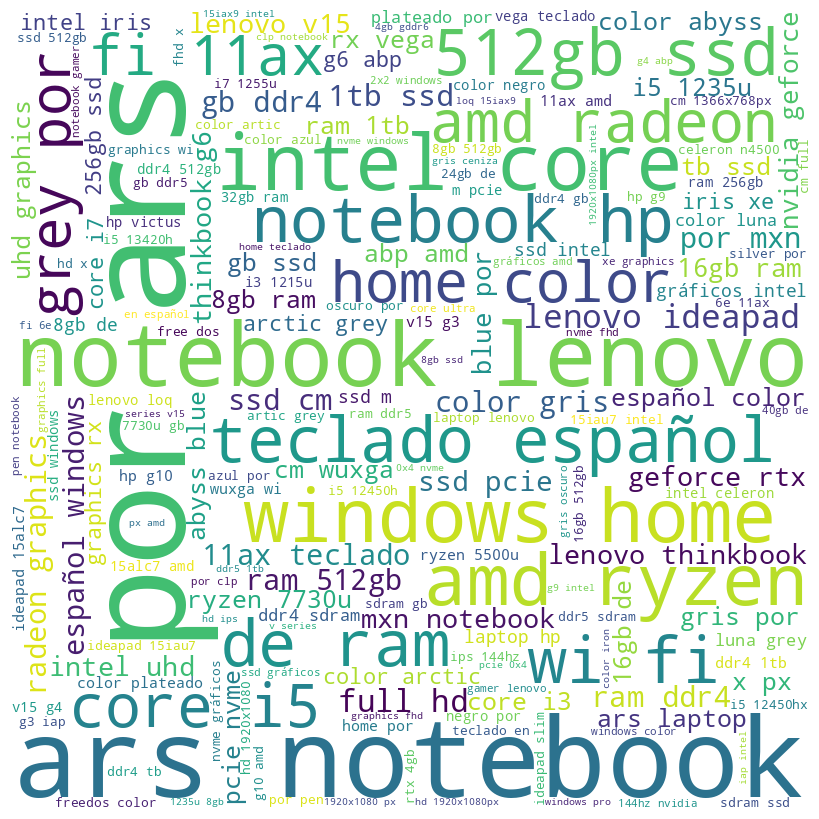

---------- Words for class: SUNGLASSES_LEGITIMO ----------


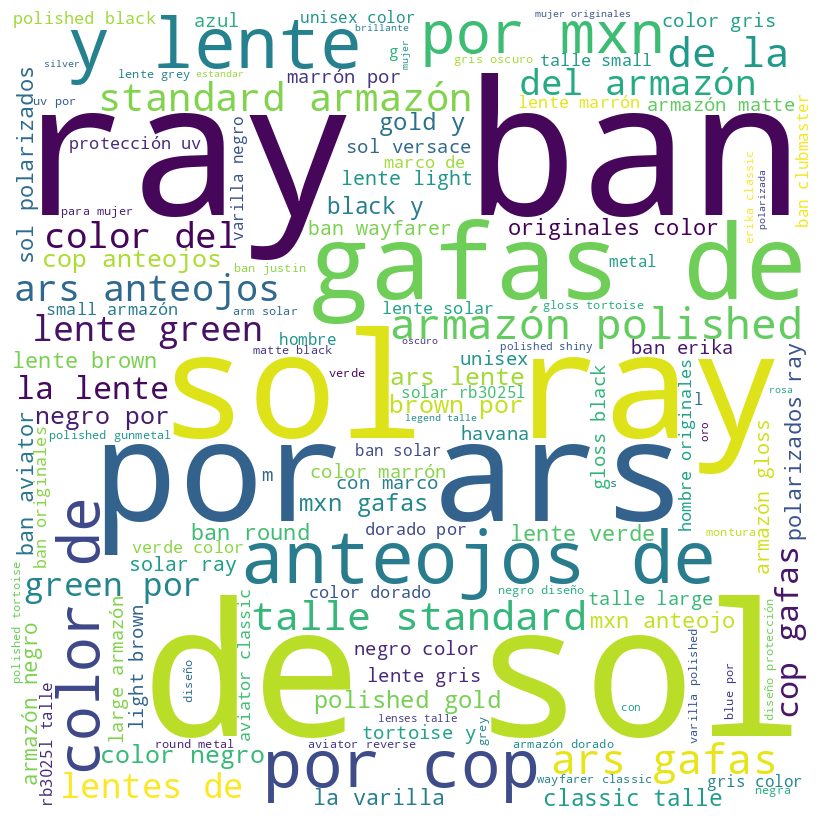

---------- Words for class: MEMORY_CARDS_LEGITIMO ----------


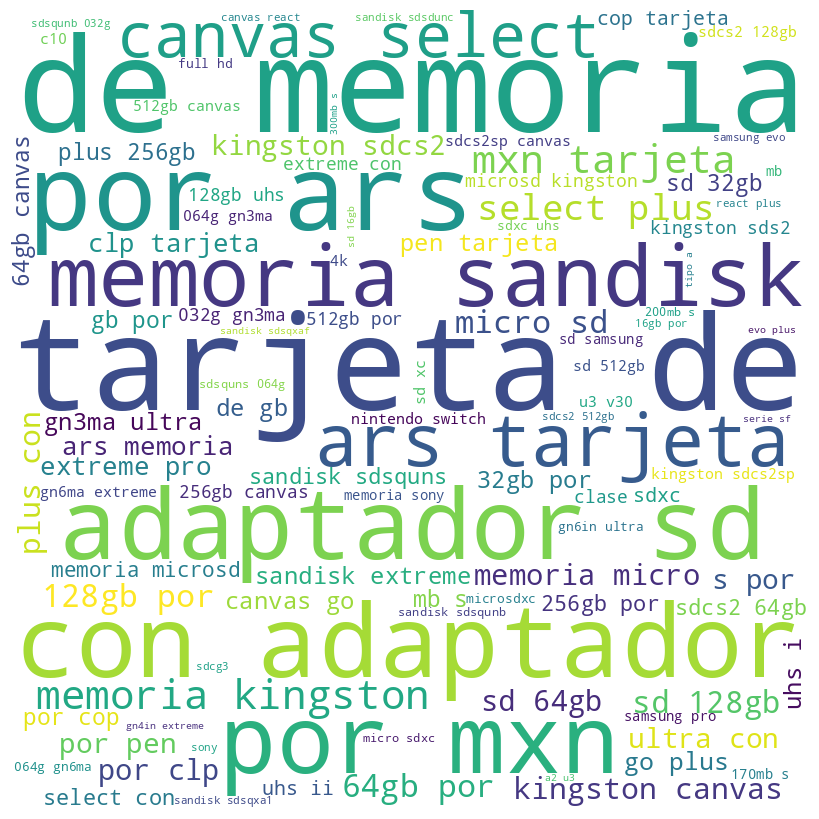

---------- Words for class: CELLPHONES_FALSO ----------


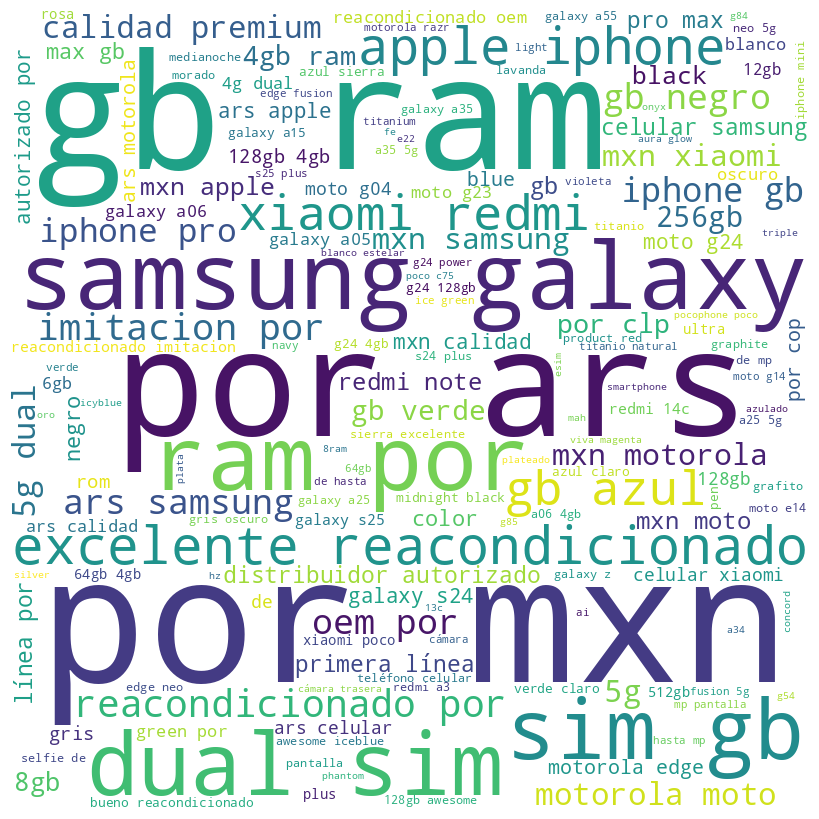

---------- Words for class: WRISTWATCHES_LEGITIMO ----------


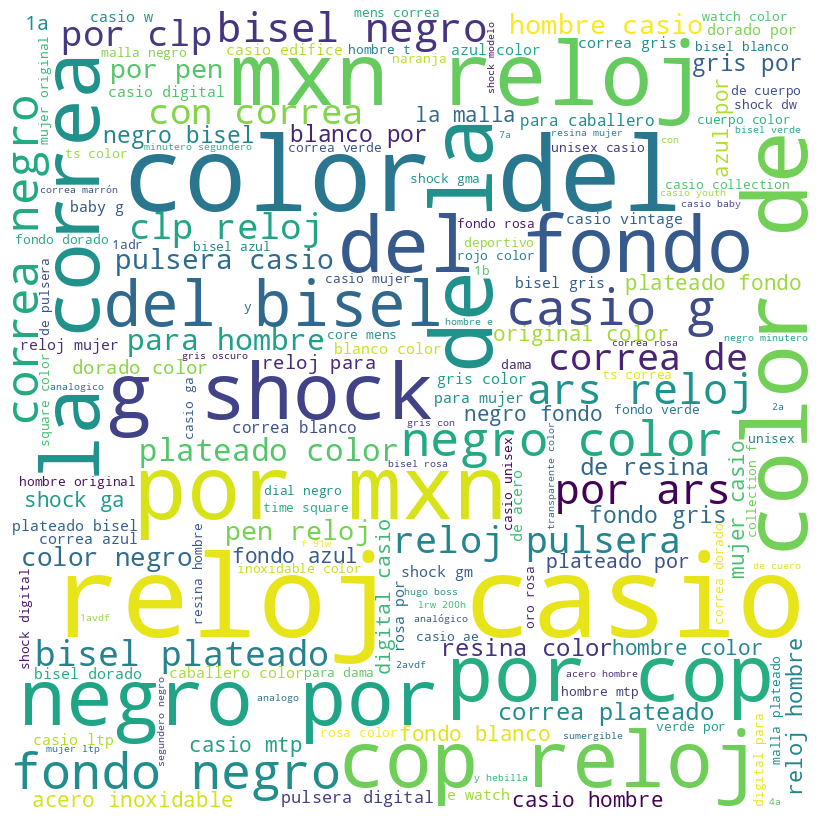

---------- Words for class: SPEAKERS_FALSO ----------


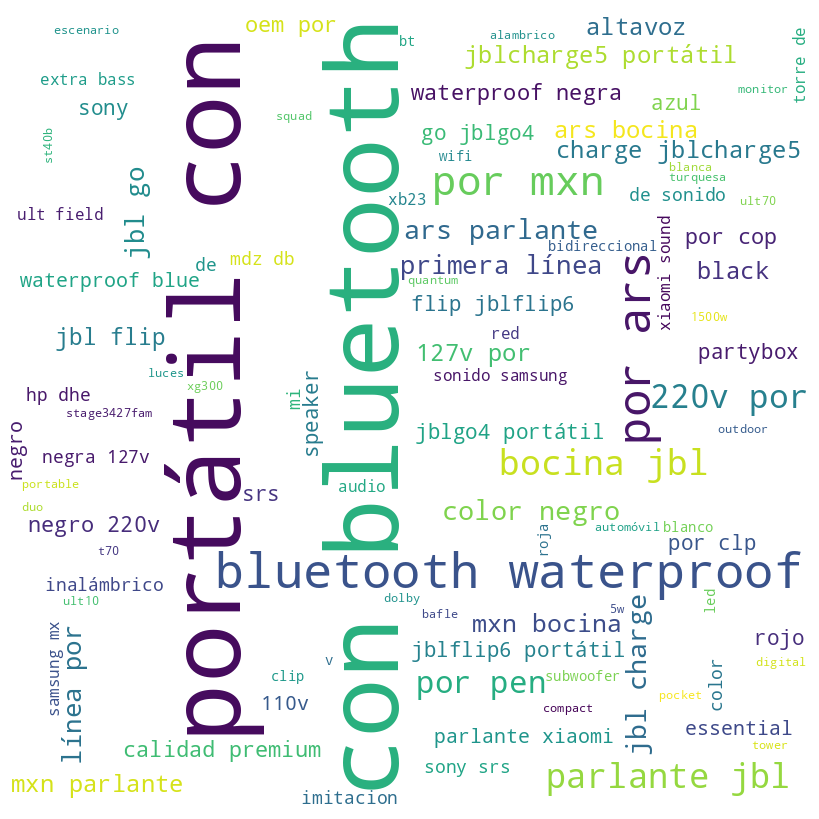

---------- Words for class: HEADPHONES_FALSO ----------


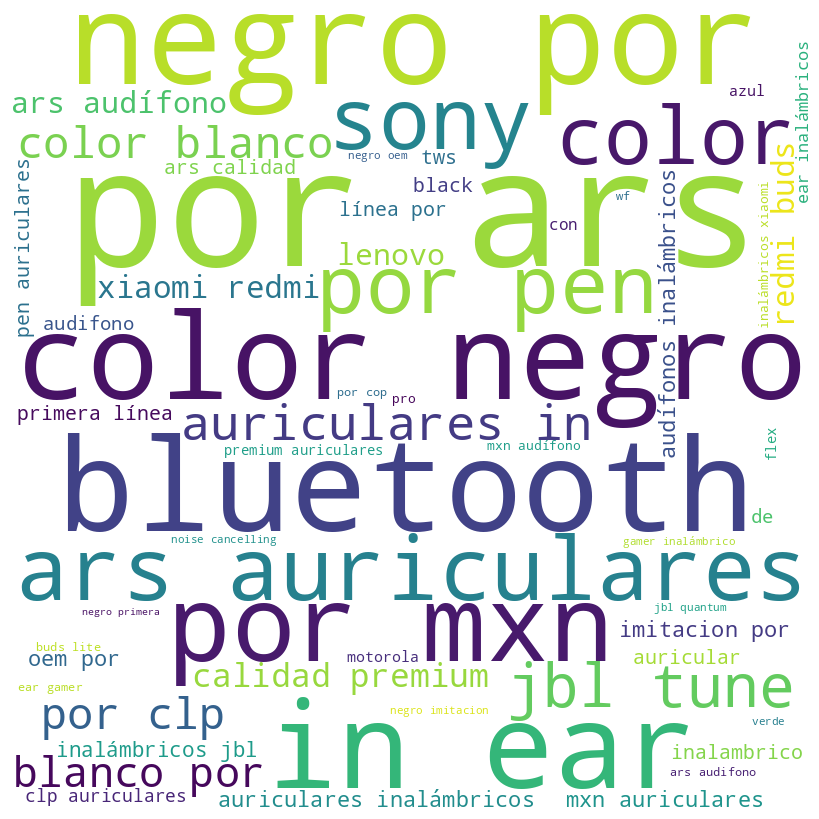

---------- Words for class: PERFUMES_LEGITIMO ----------


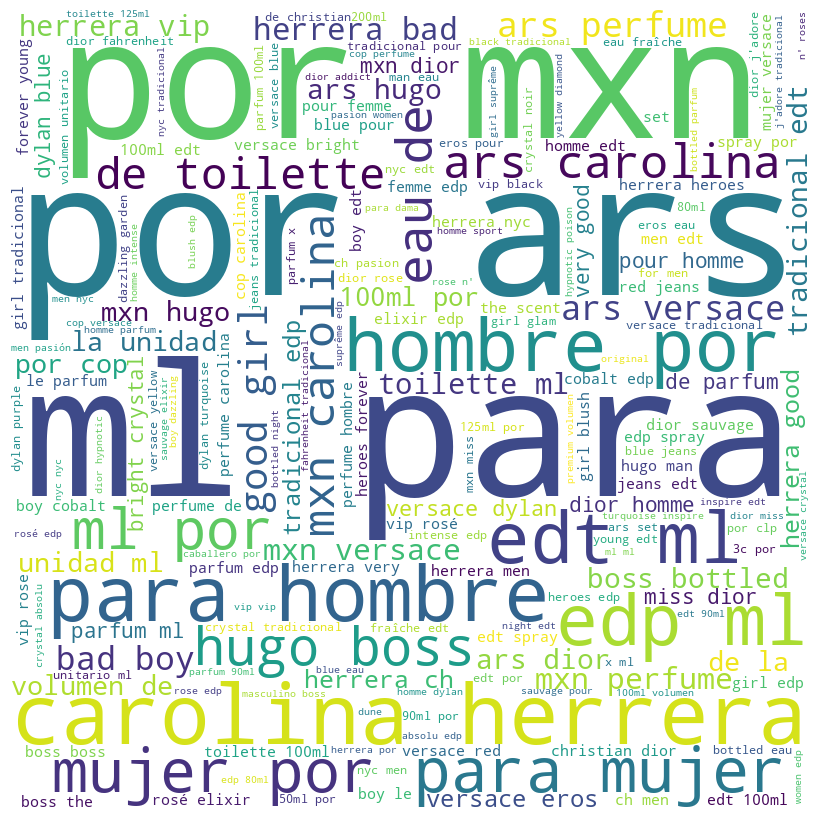

---------- Words for class: RAM_MEMORY_MODULES_LEGITIMO ----------


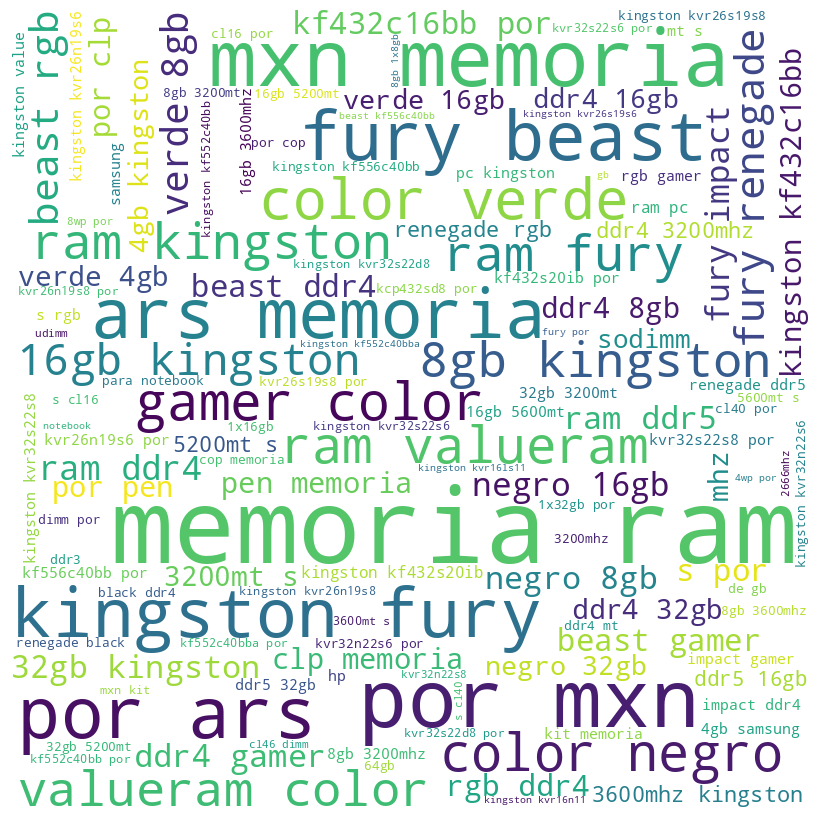

---------- Words for class: CELLPHONES_LEGITIMO ----------


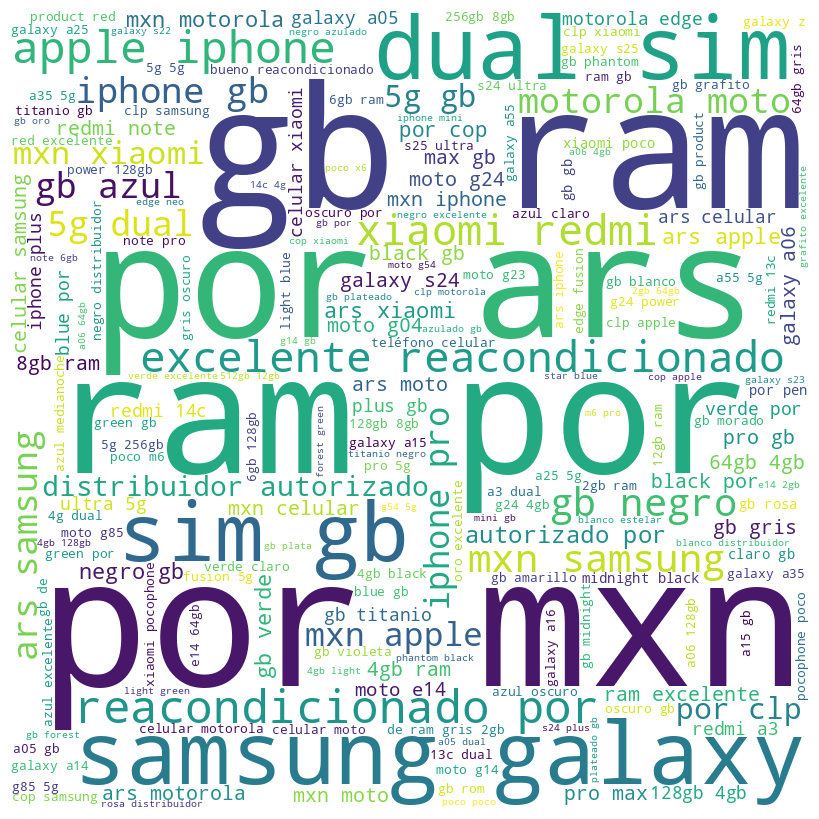

---------- Words for class: HEADPHONES_LEGITIMO ----------


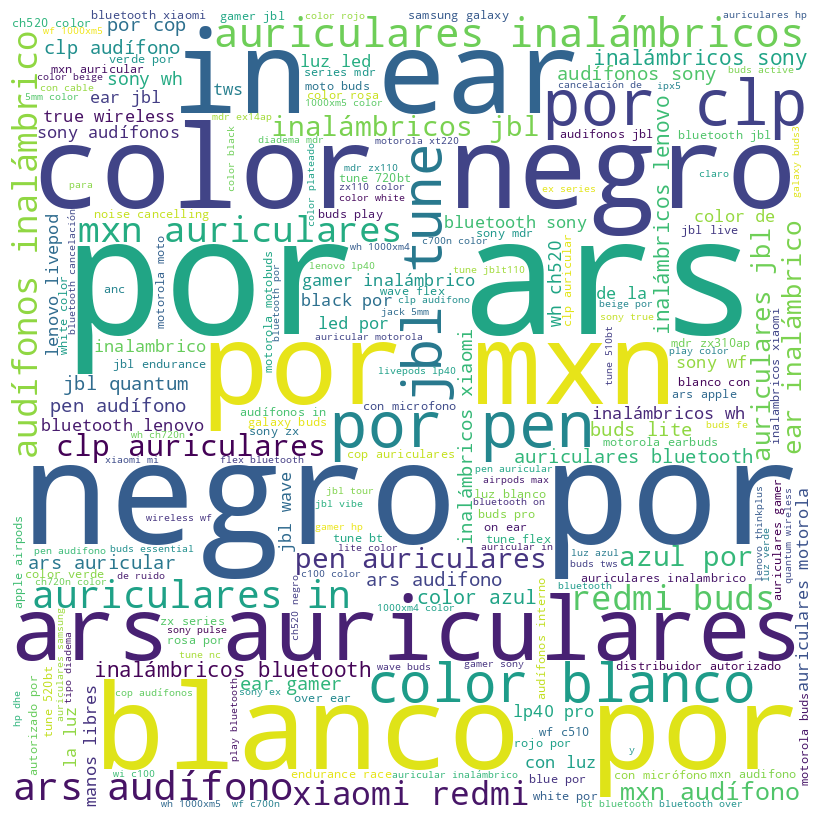

---------- Words for class: PERFUMES_FALSO ----------


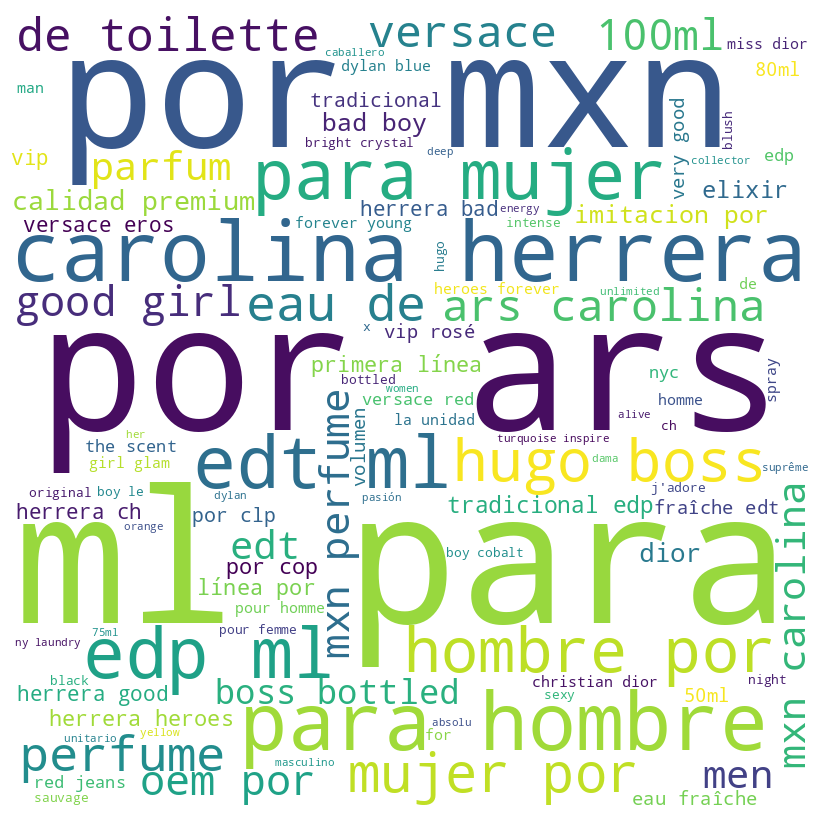

---------- Words for class: WRISTWATCHES_FALSO ----------


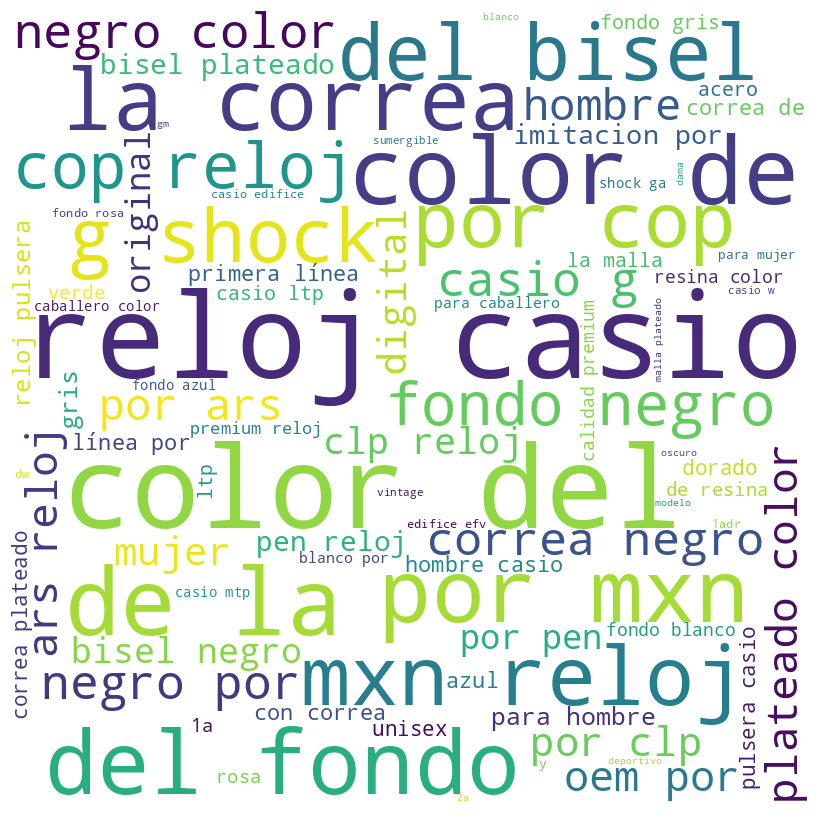

---------- Words for class: SPEAKERS_LEGITIMO ----------


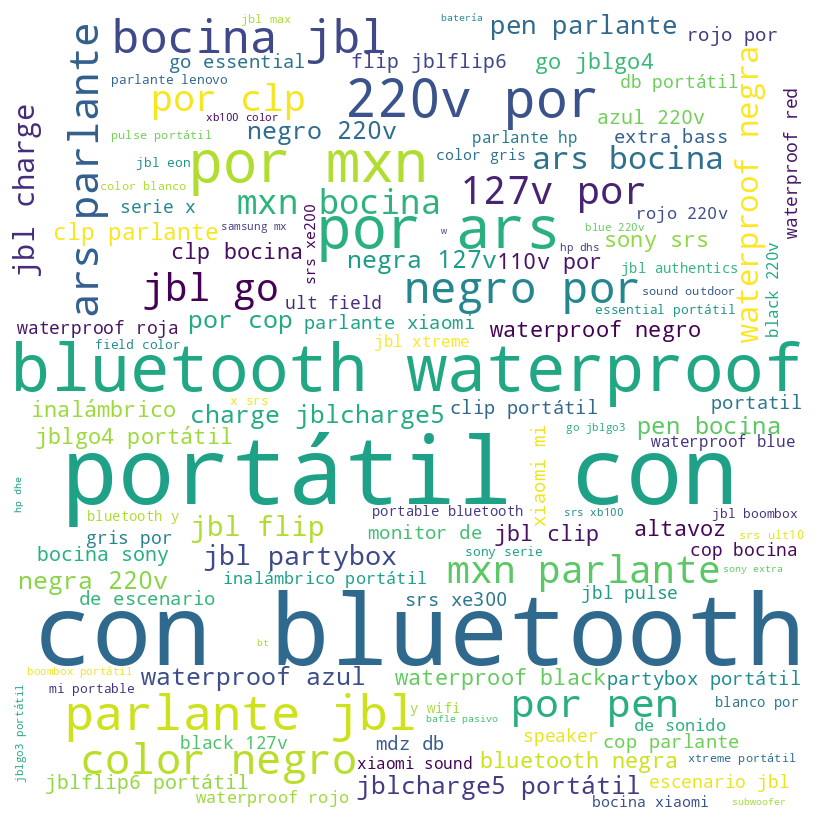

---------- Words for class: INK_CARTRIDGES_LEGITIMO ----------


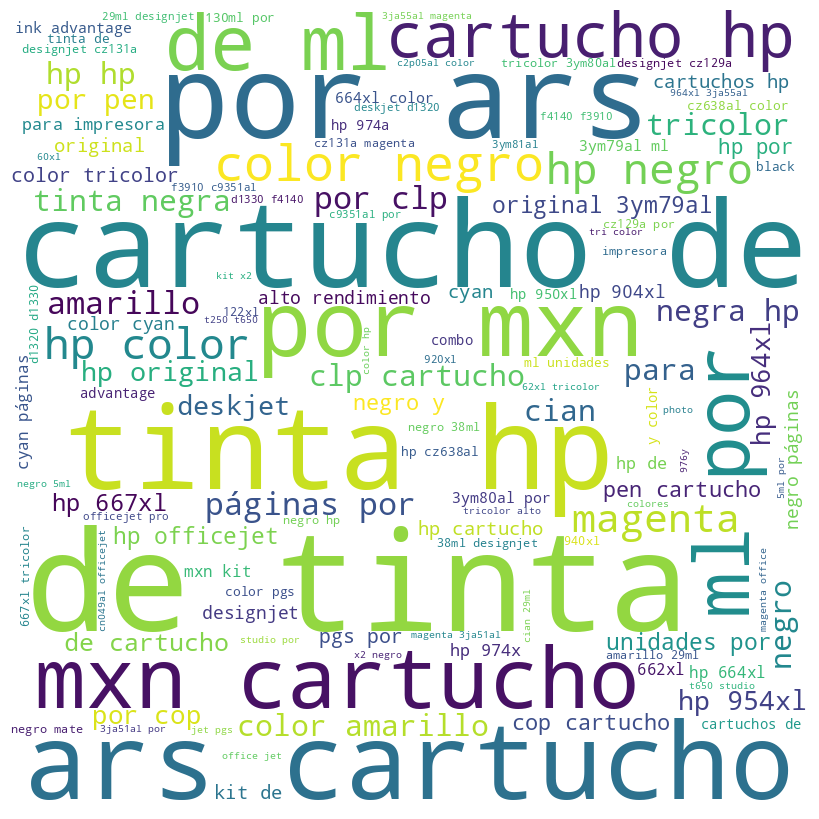

---------- Words for class: RAM_MEMORY_MODULES_FALSO ----------


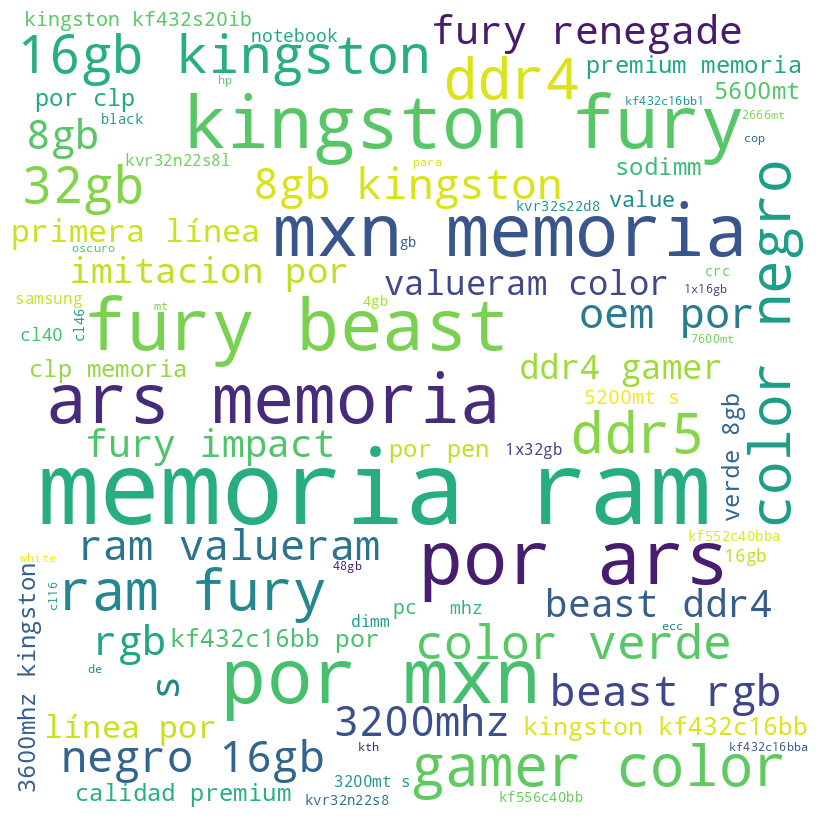

---------- Words for class: SUNGLASSES_FALSO ----------


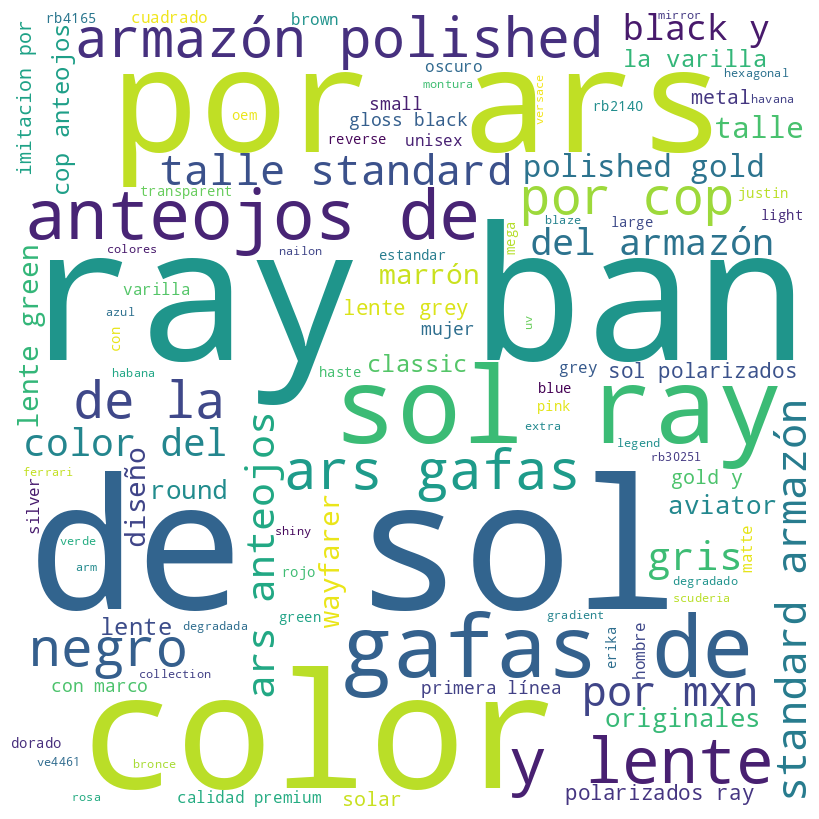

---------- Words for class: MEMORY_CARDS_FALSO ----------


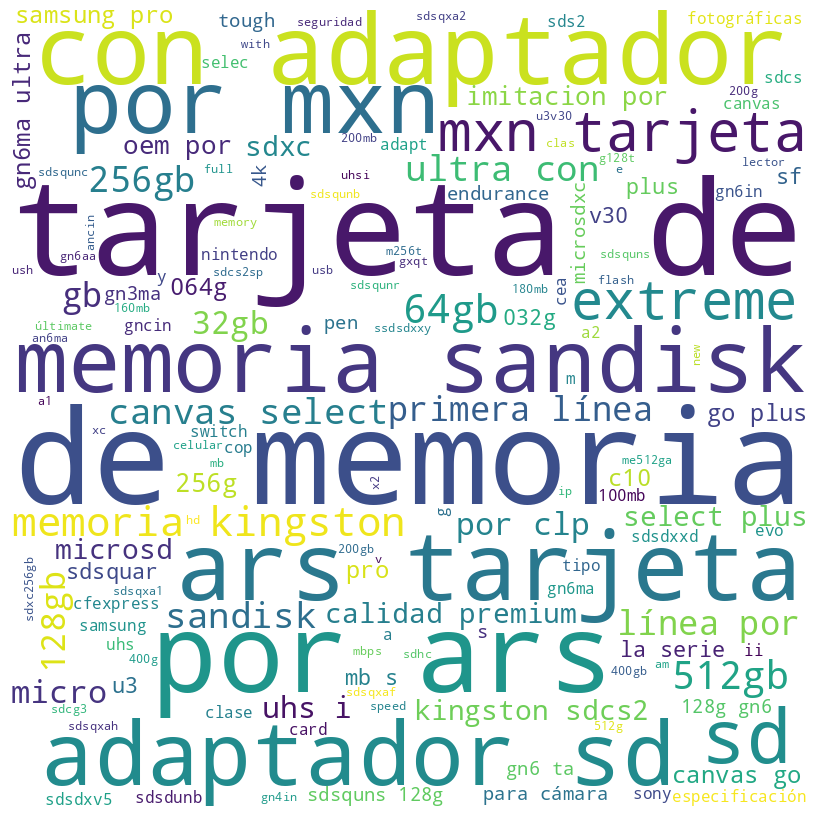

---------- Words for class: NOTEBOOKS_FALSO ----------


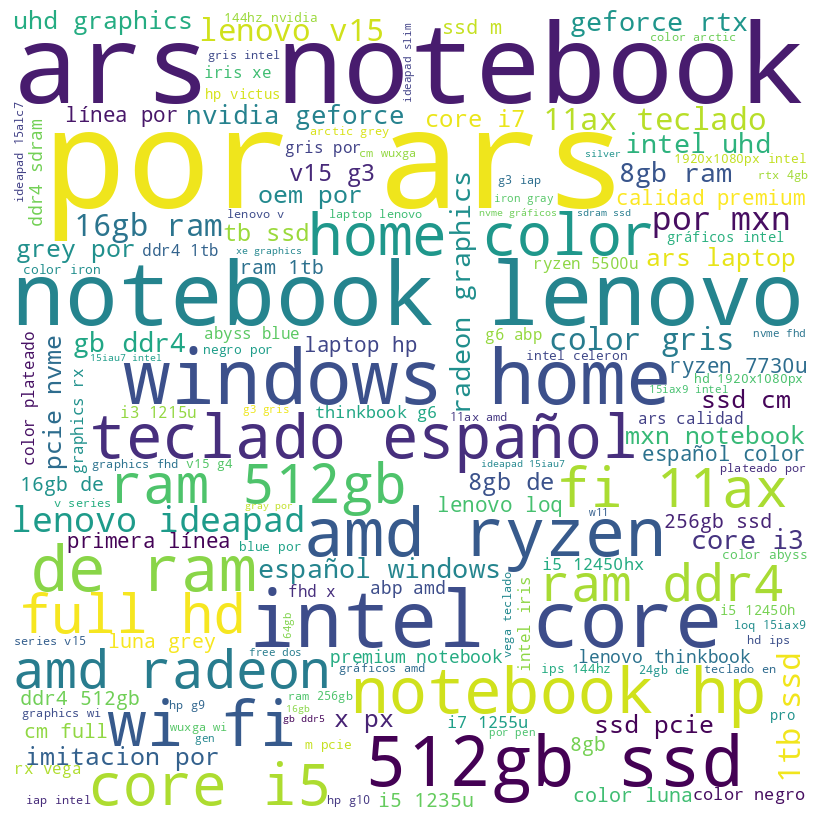

---------- Words for class: INK_CARTRIDGES_FALSO ----------


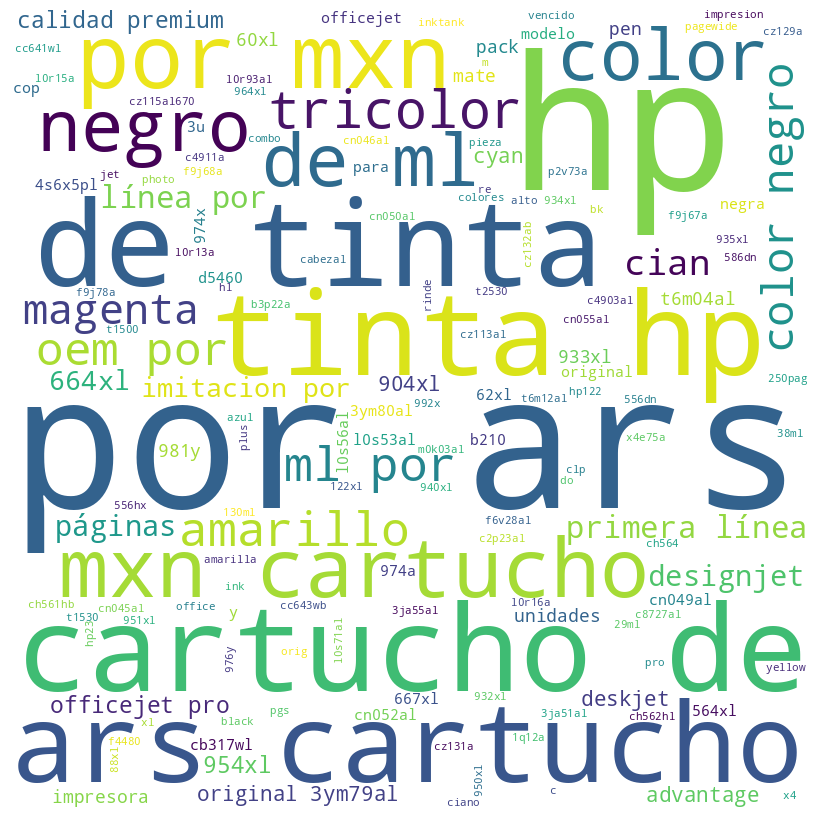

In [ ]:
for i in train_df[target_feature].unique():
    print(f'---------- Words for class: {i} ----------')
    show_wordcloud(train_df.loc[train_df[target_feature]==i, x_feature])

In [ ]:
stop_words = stopwords.words('spanish')

---------- Words for class: NOTEBOOKS_LEGITIMO ----------


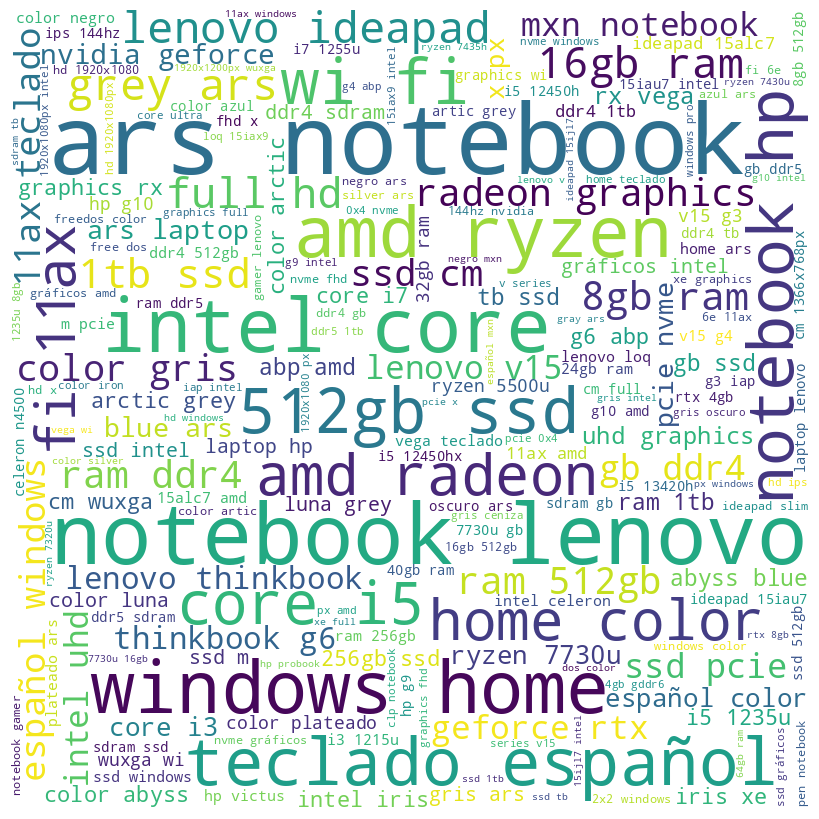

---------- Words for class: SUNGLASSES_LEGITIMO ----------


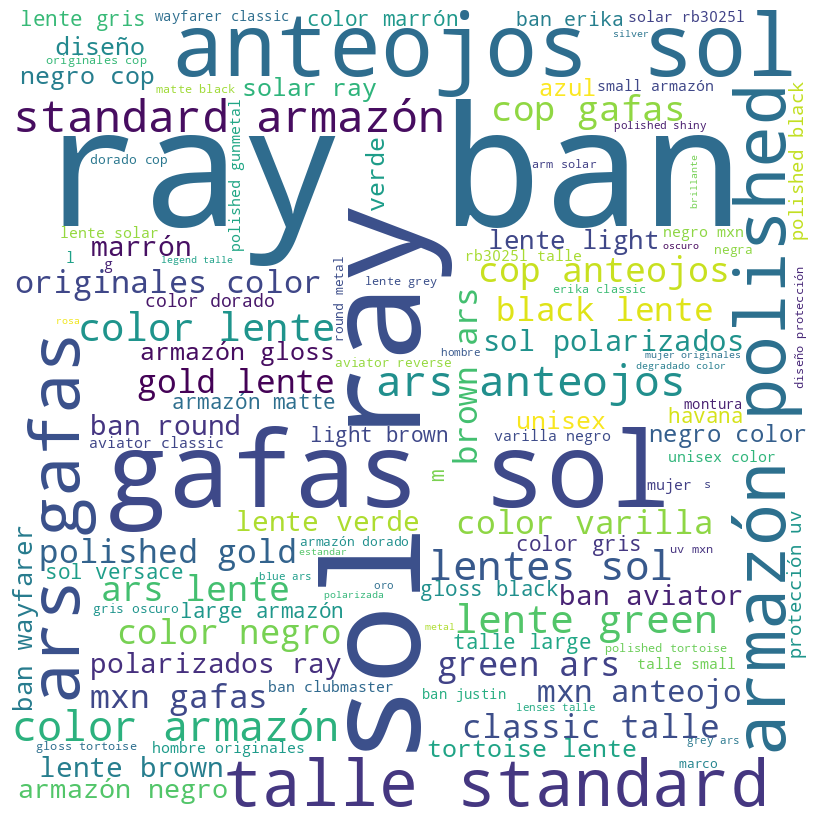

---------- Words for class: MEMORY_CARDS_LEGITIMO ----------


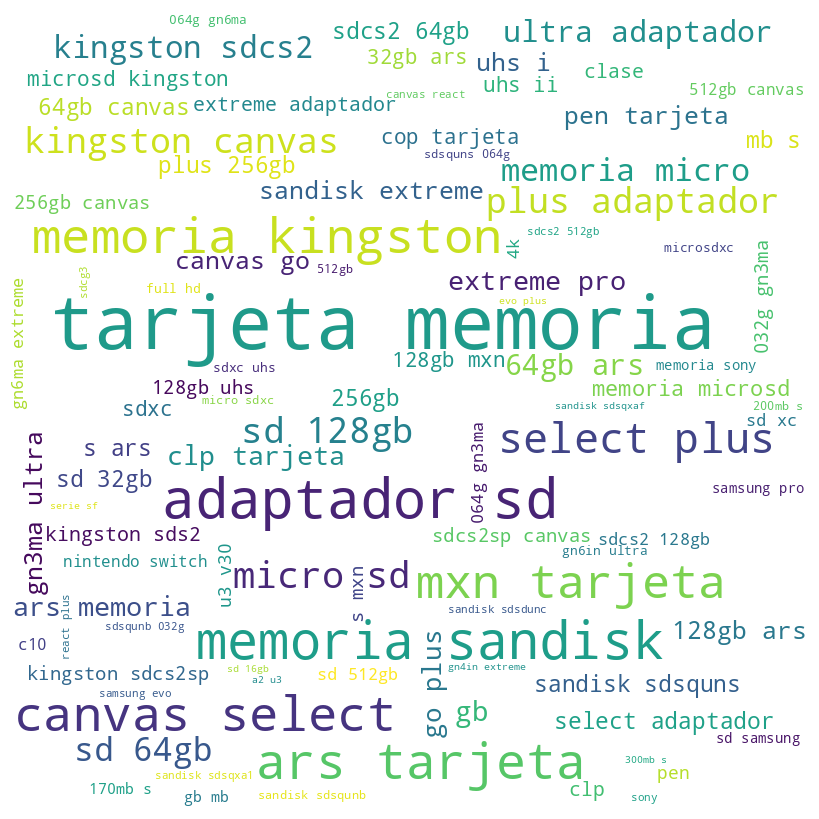

---------- Words for class: CELLPHONES_FALSO ----------


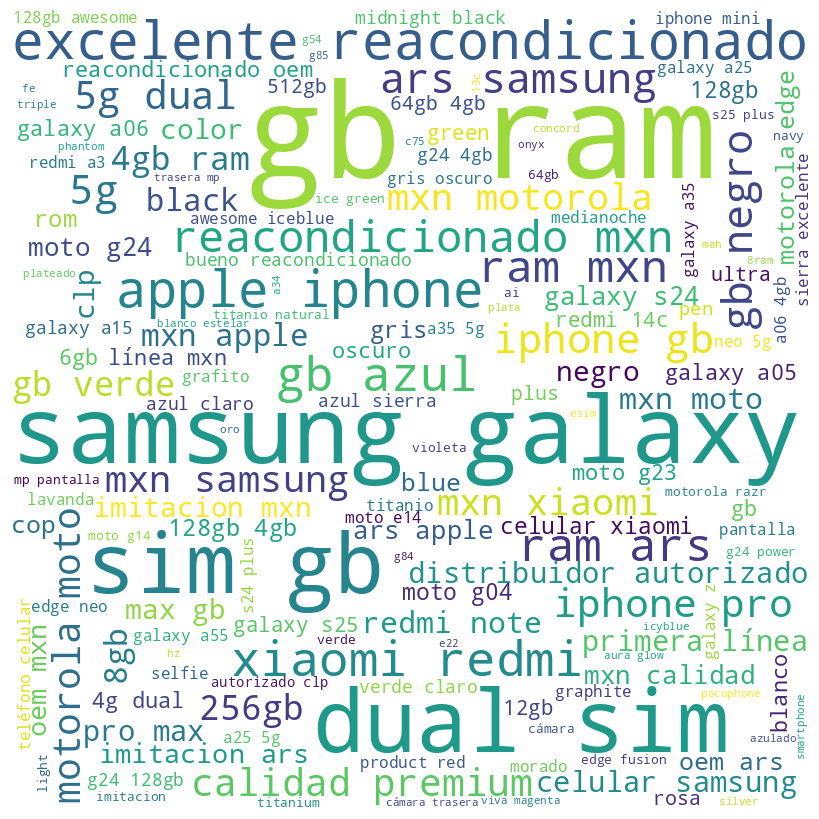

---------- Words for class: WRISTWATCHES_LEGITIMO ----------


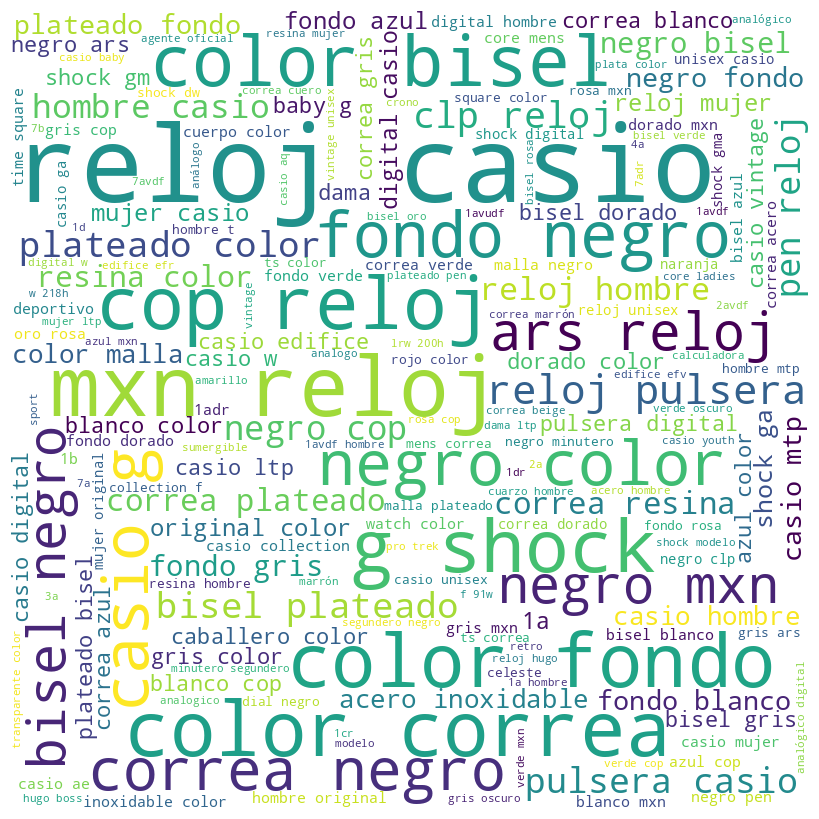

---------- Words for class: SPEAKERS_FALSO ----------


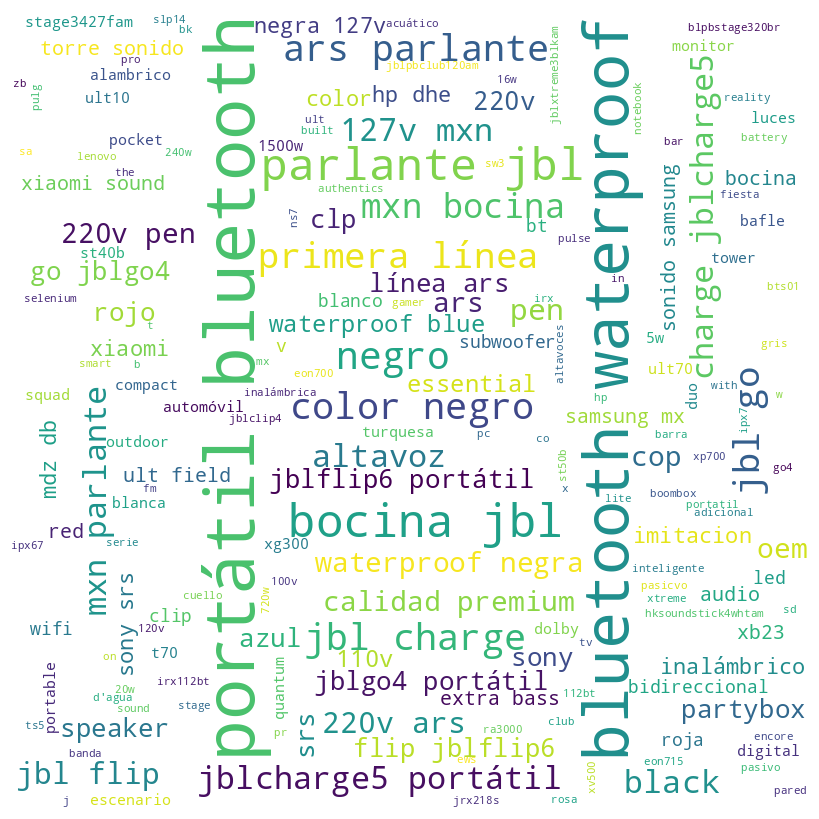

---------- Words for class: HEADPHONES_FALSO ----------


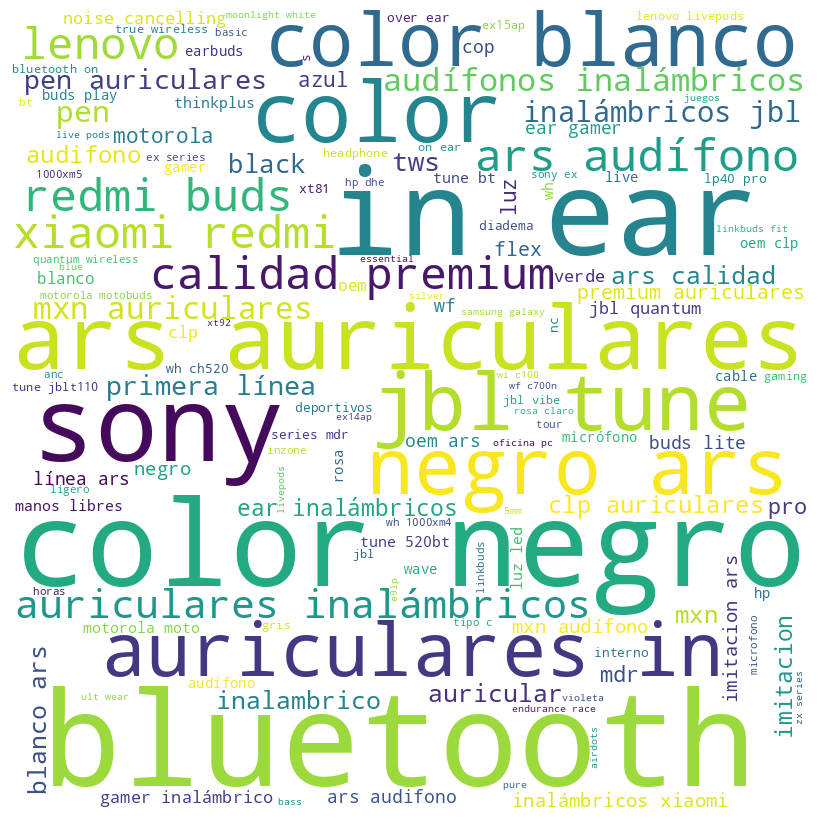

---------- Words for class: PERFUMES_LEGITIMO ----------


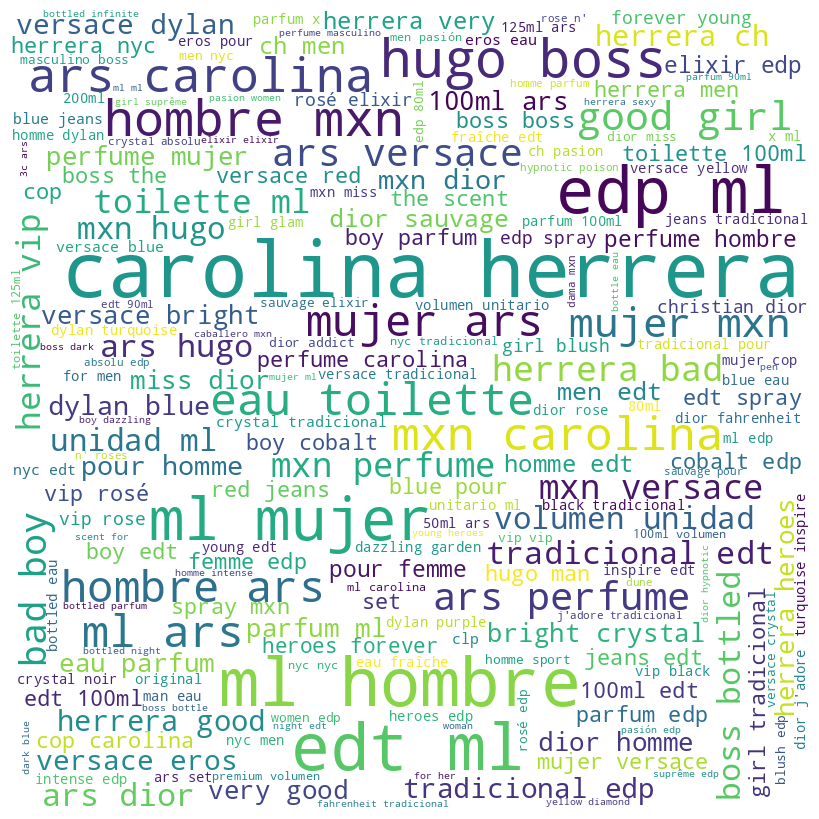

---------- Words for class: RAM_MEMORY_MODULES_LEGITIMO ----------


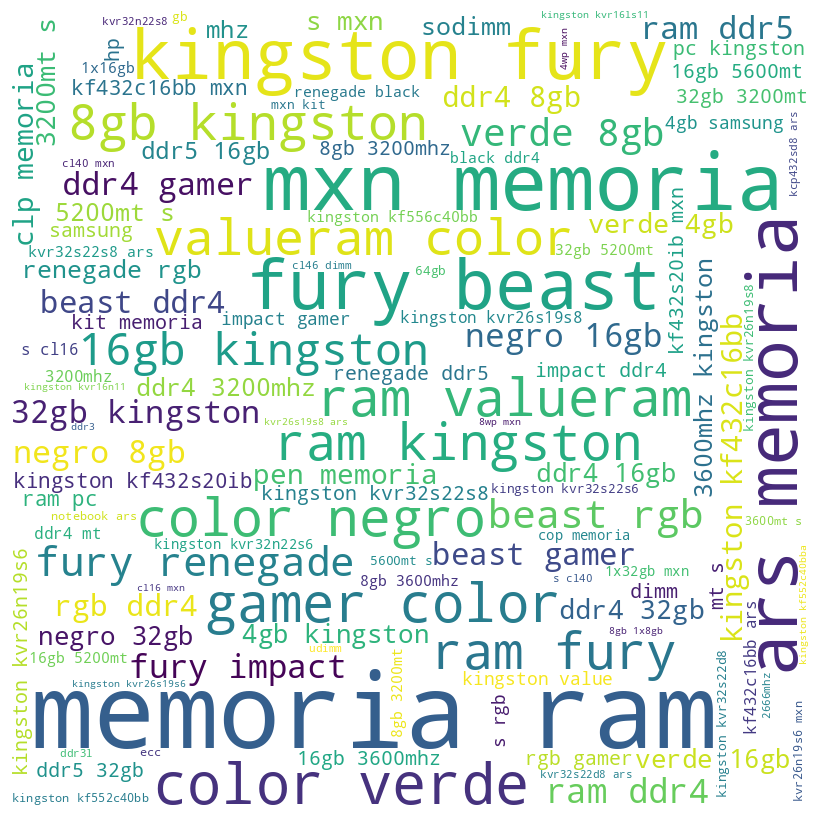

---------- Words for class: CELLPHONES_LEGITIMO ----------


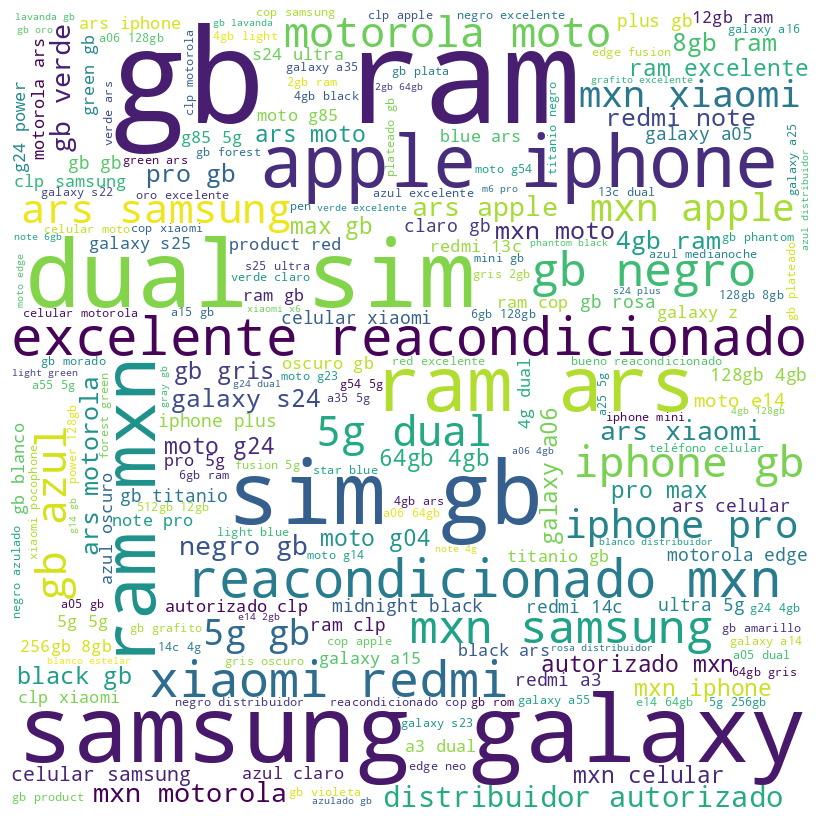

---------- Words for class: HEADPHONES_LEGITIMO ----------


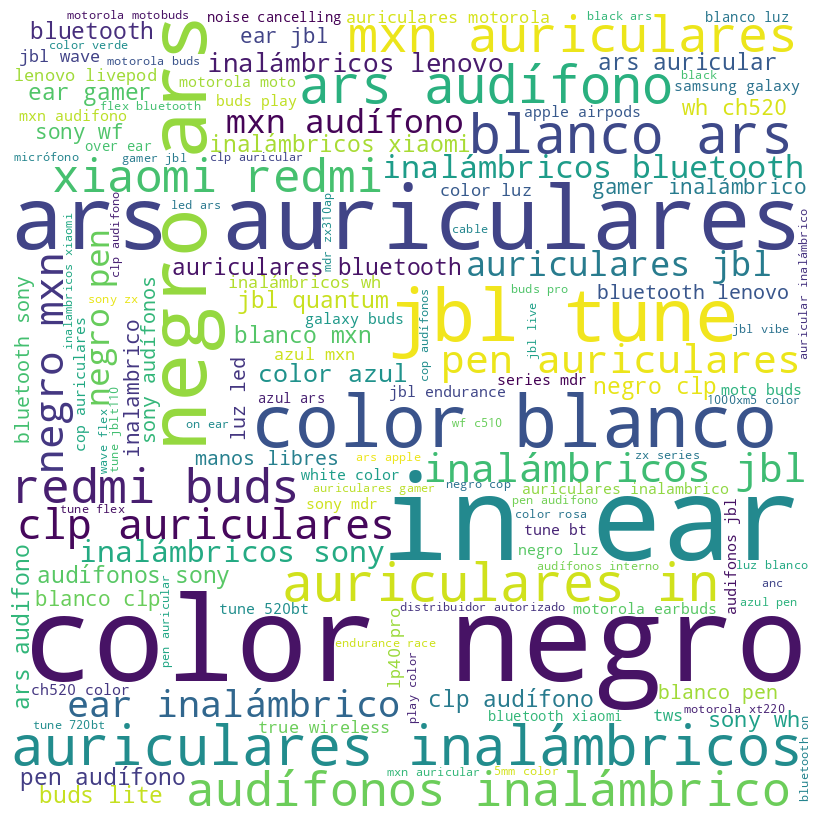

---------- Words for class: PERFUMES_FALSO ----------


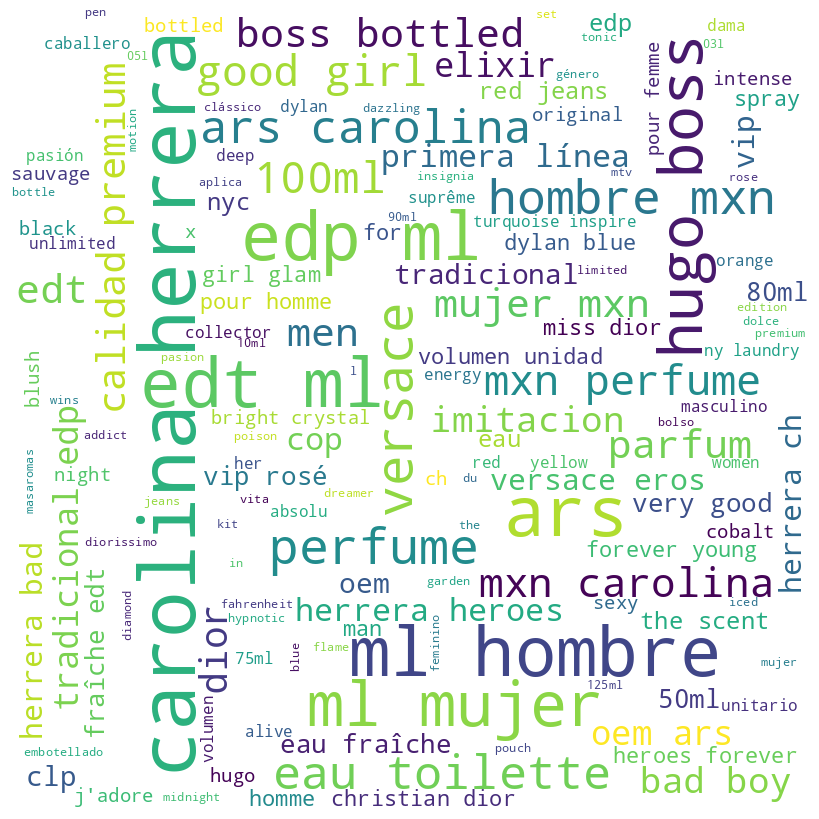

---------- Words for class: WRISTWATCHES_FALSO ----------


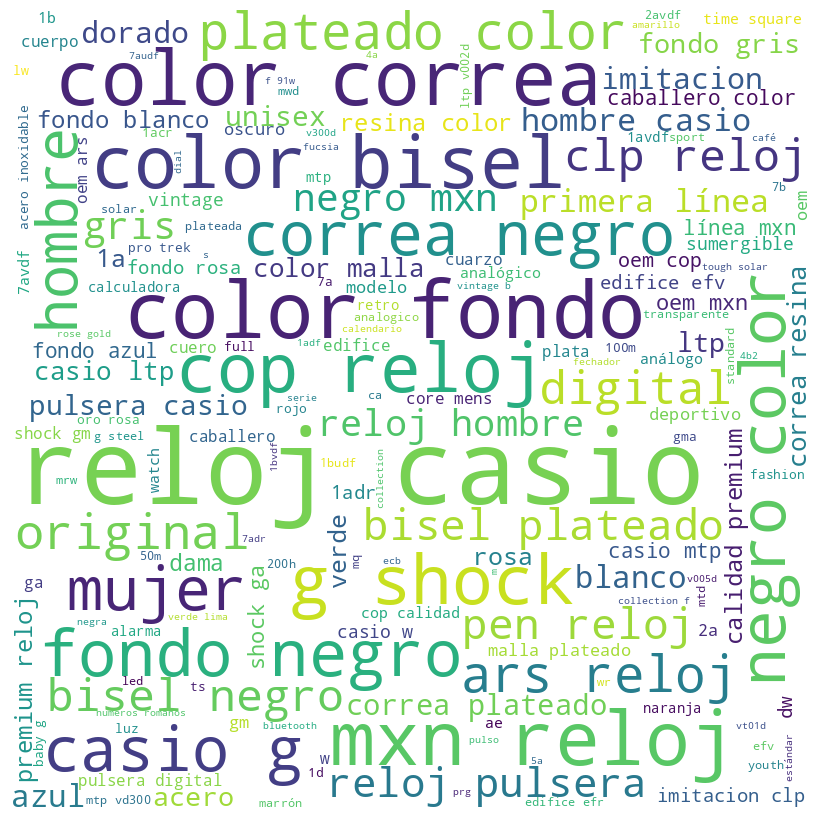

---------- Words for class: SPEAKERS_LEGITIMO ----------


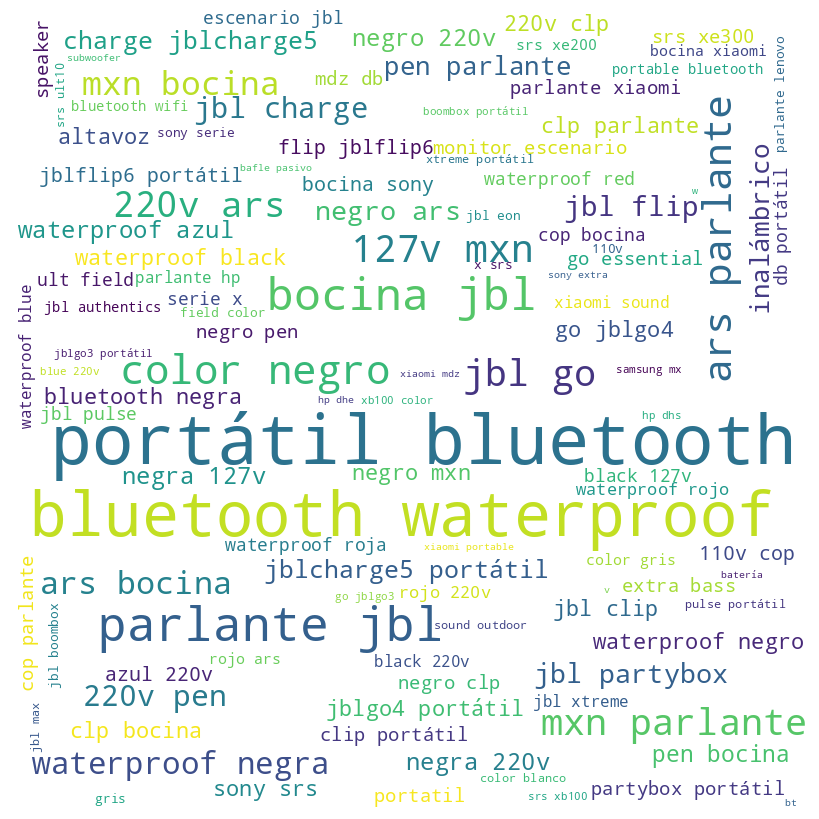

---------- Words for class: INK_CARTRIDGES_LEGITIMO ----------


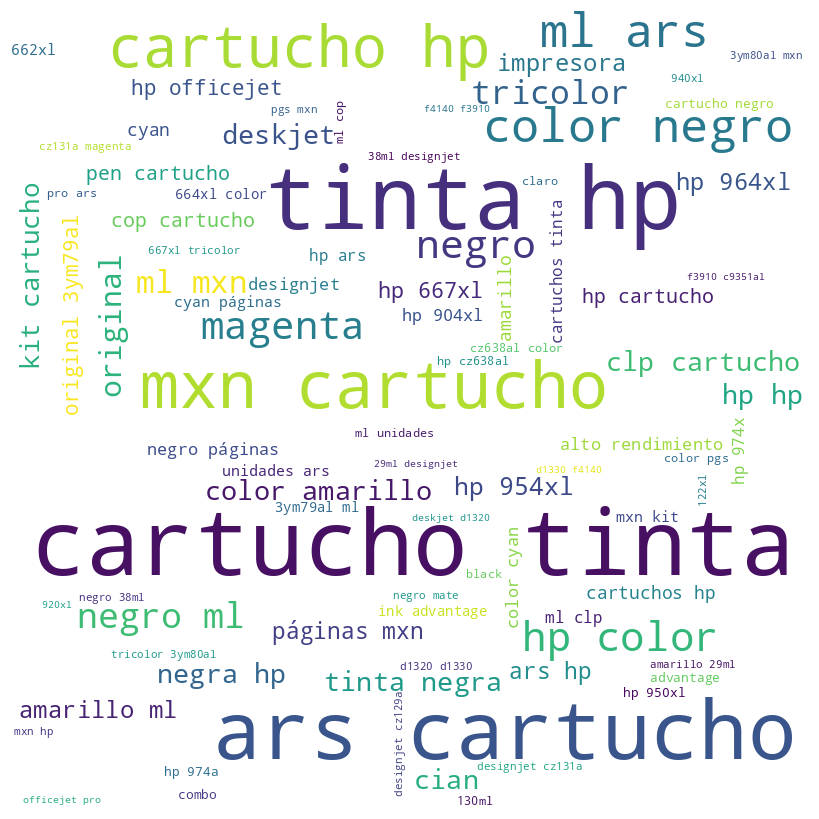

---------- Words for class: RAM_MEMORY_MODULES_FALSO ----------


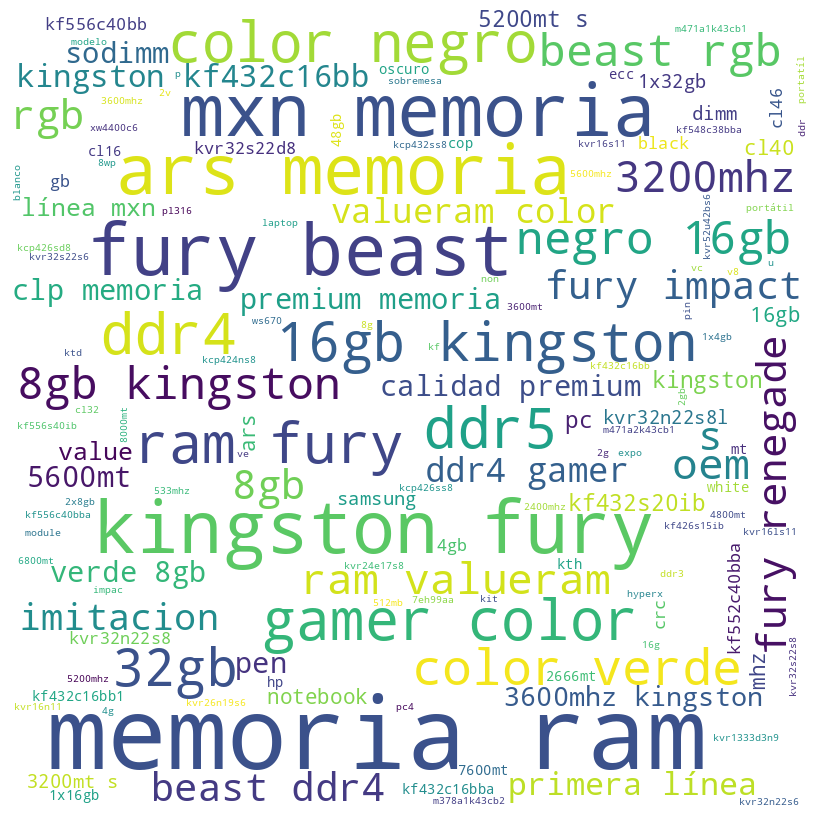

---------- Words for class: SUNGLASSES_FALSO ----------


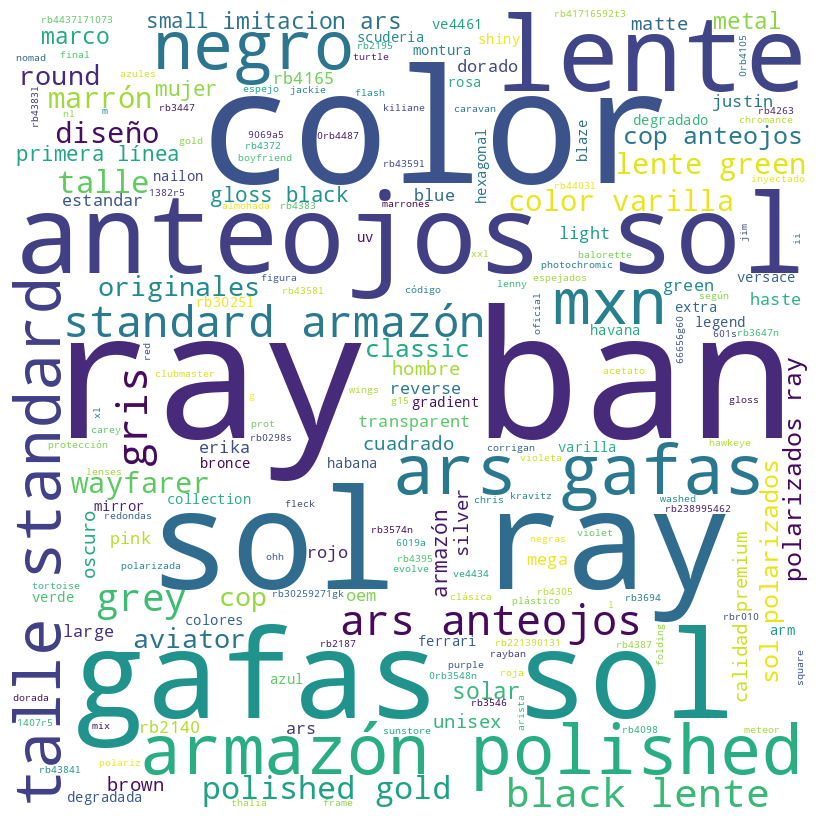

---------- Words for class: MEMORY_CARDS_FALSO ----------


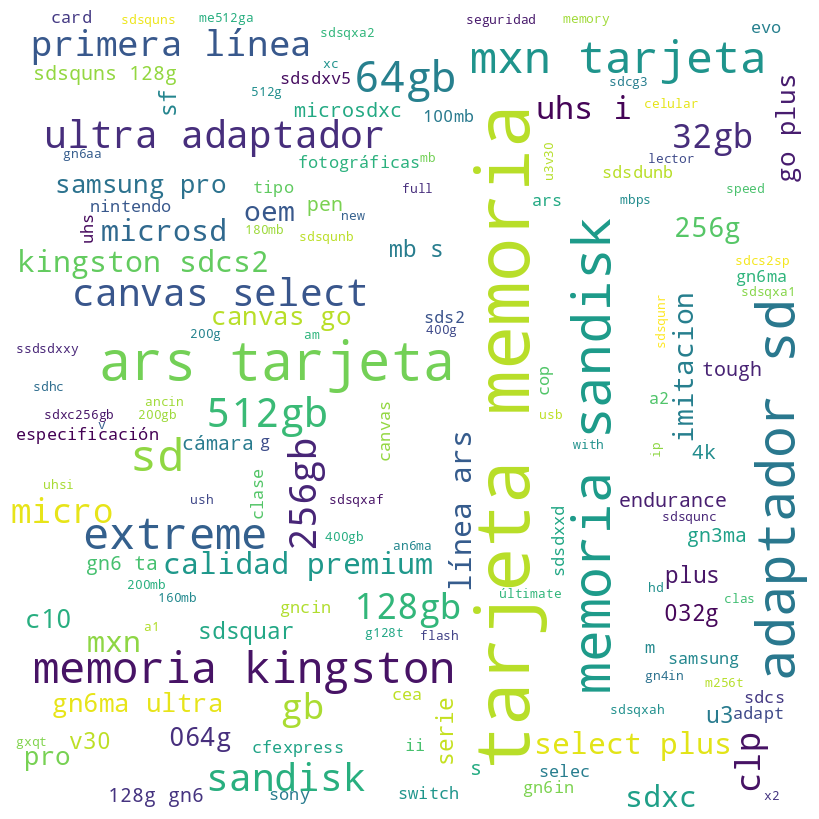

---------- Words for class: NOTEBOOKS_FALSO ----------


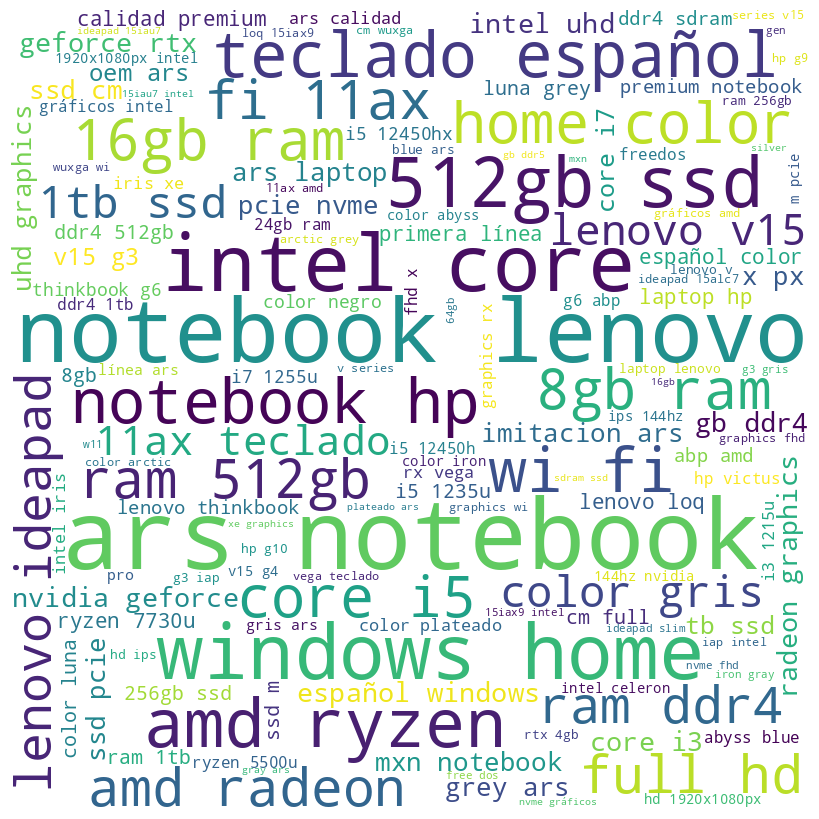

---------- Words for class: INK_CARTRIDGES_FALSO ----------


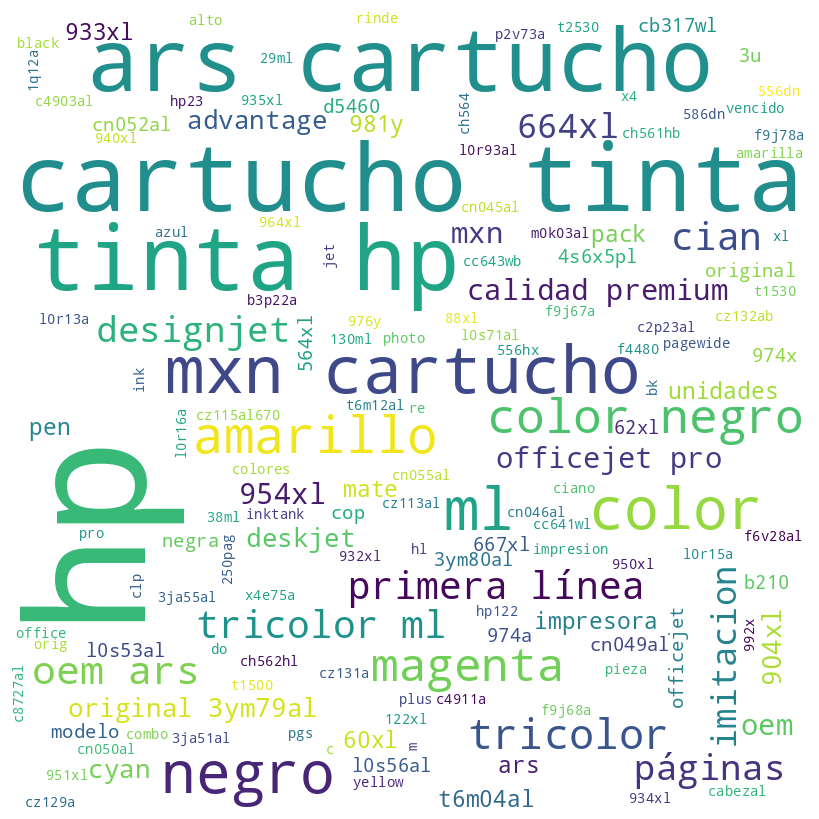

In [ ]:
for i in train_df[target_feature].unique():
    print(f'---------- Words for class: {i} ----------')
    show_wordcloud(train_df.loc[train_df[target_feature]==i, x_feature], stop_words)

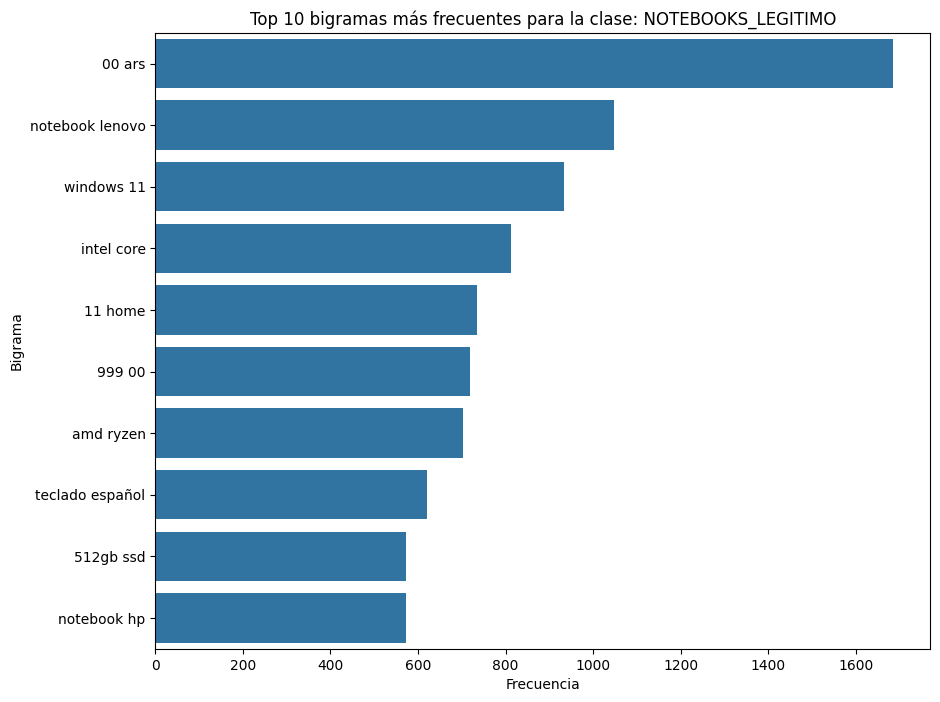

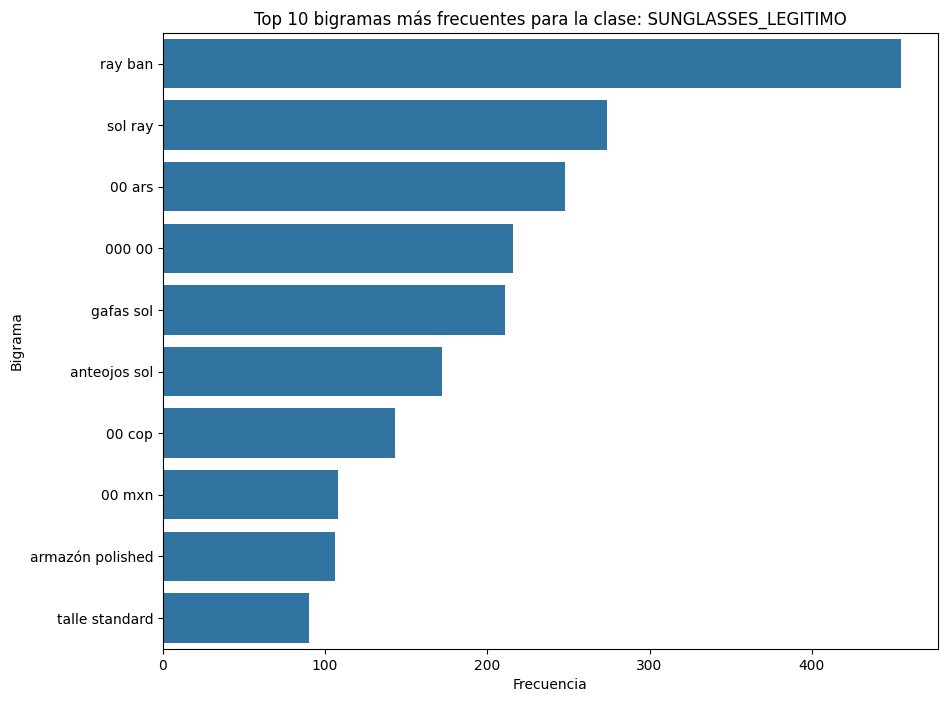

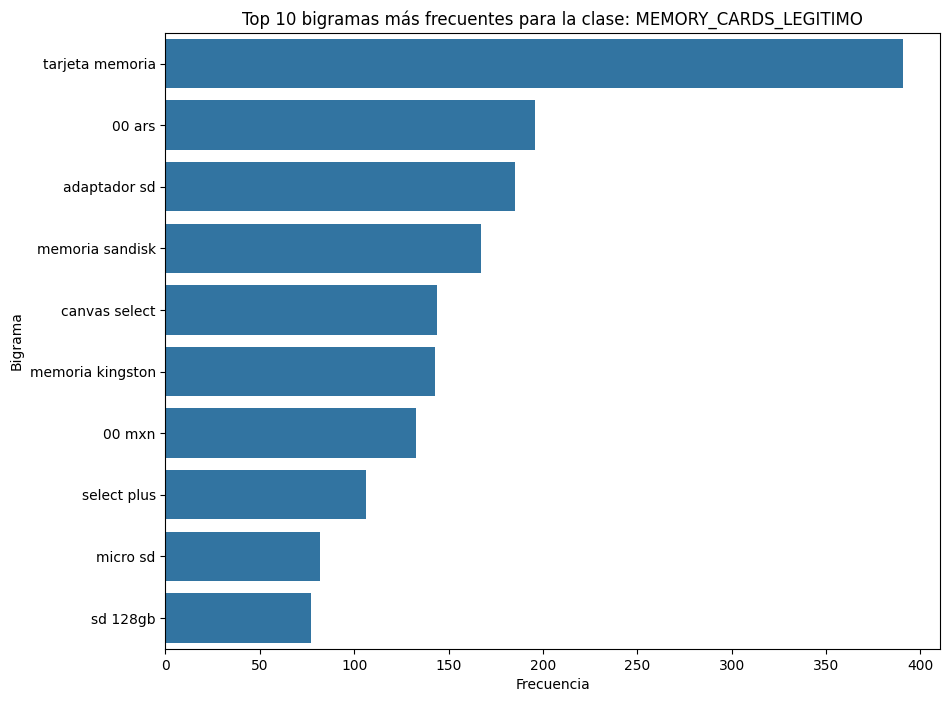

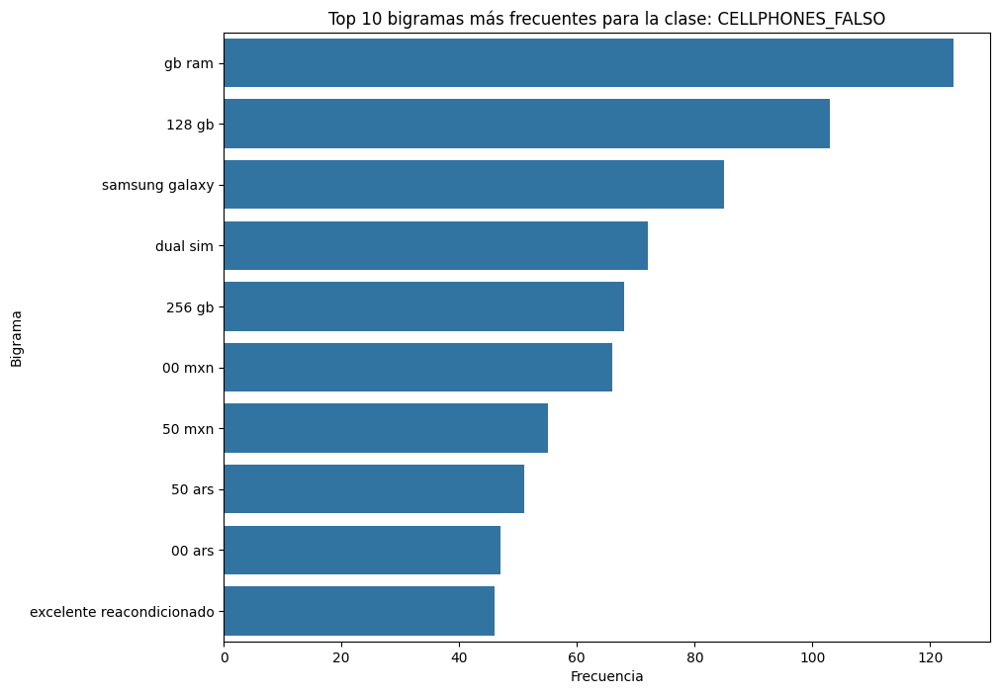

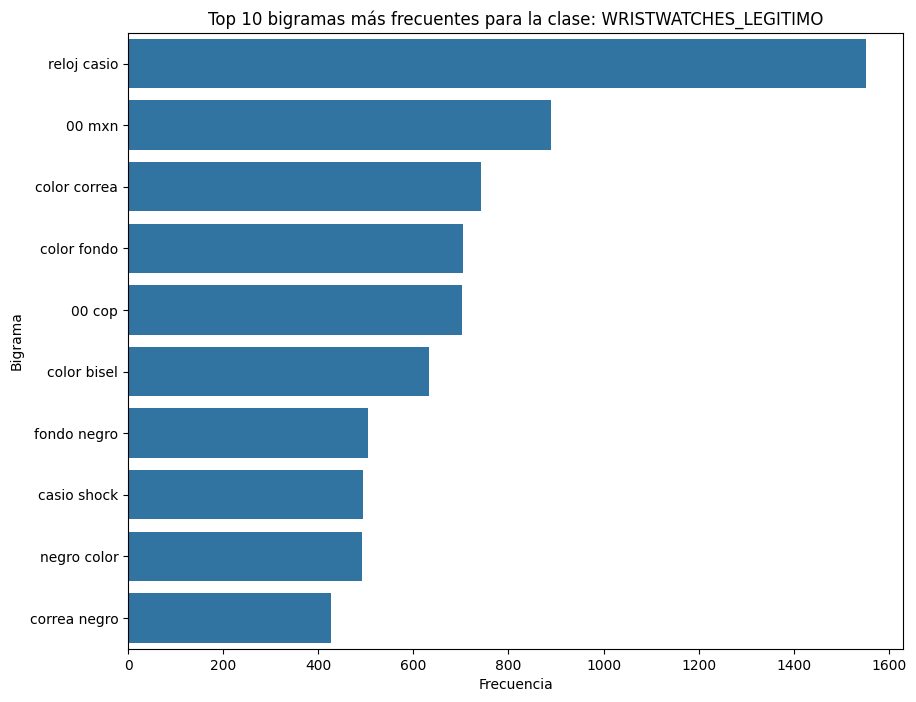

...

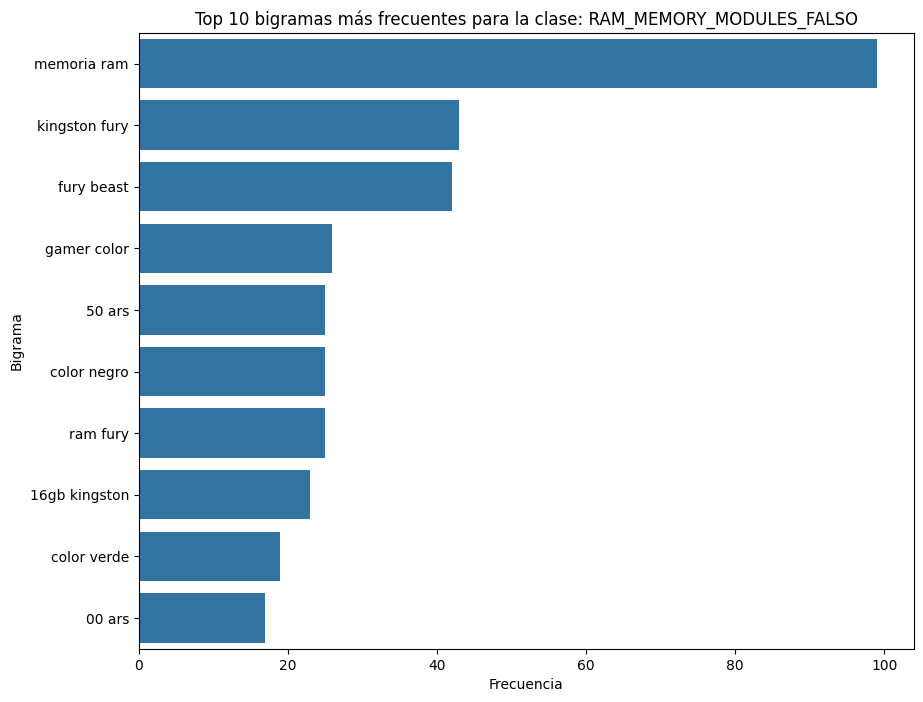

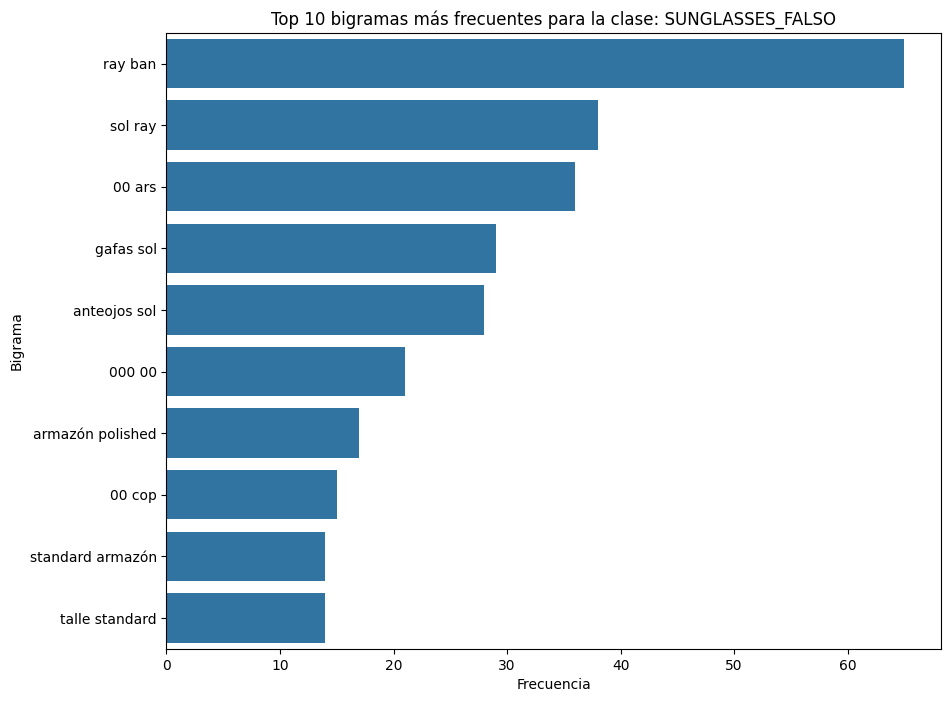

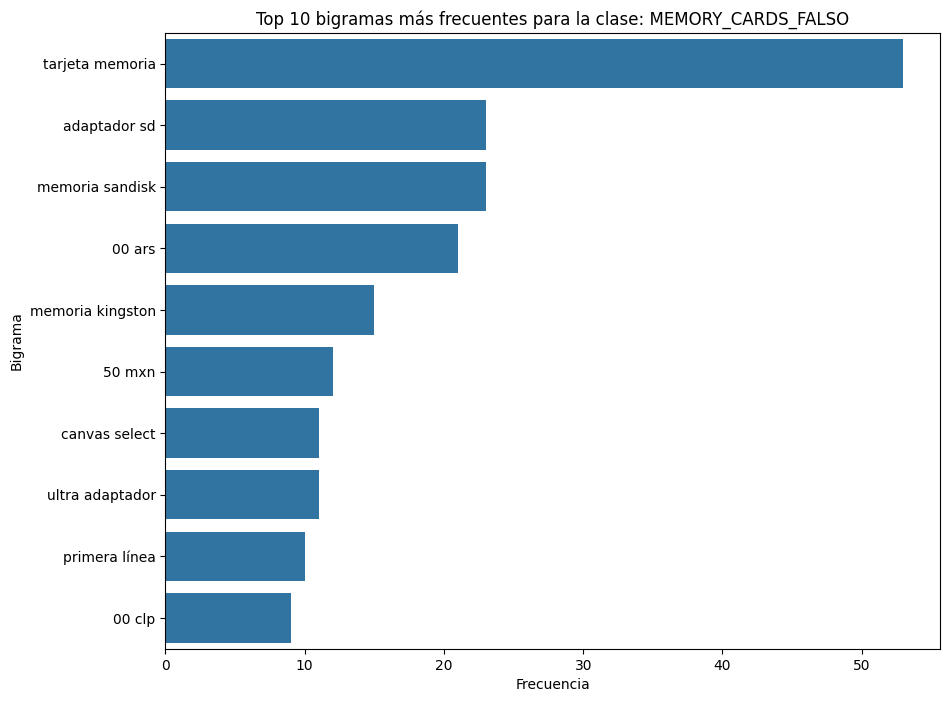

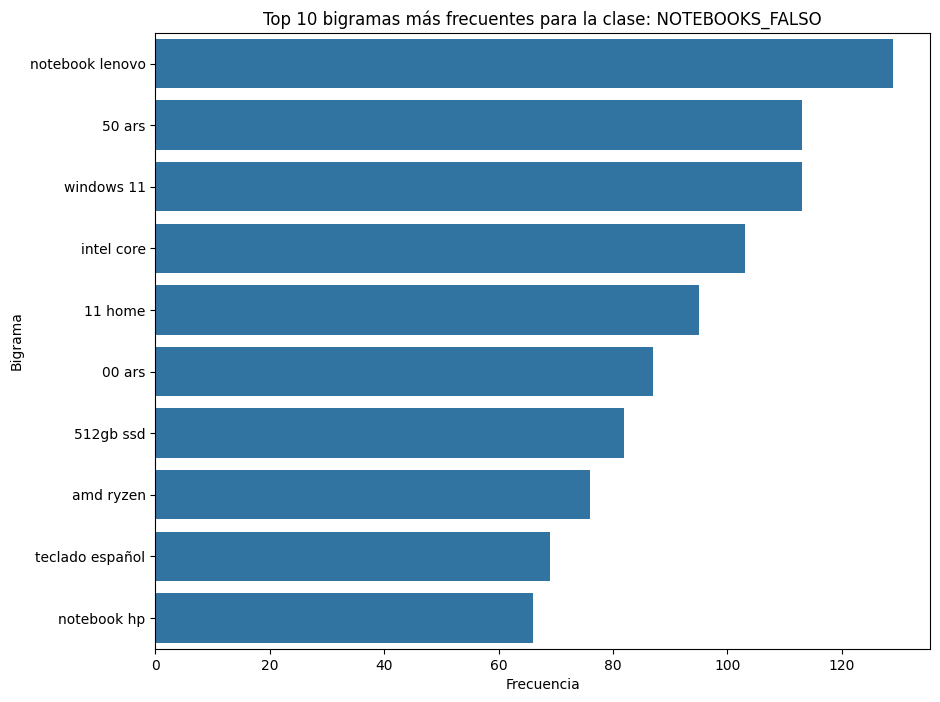

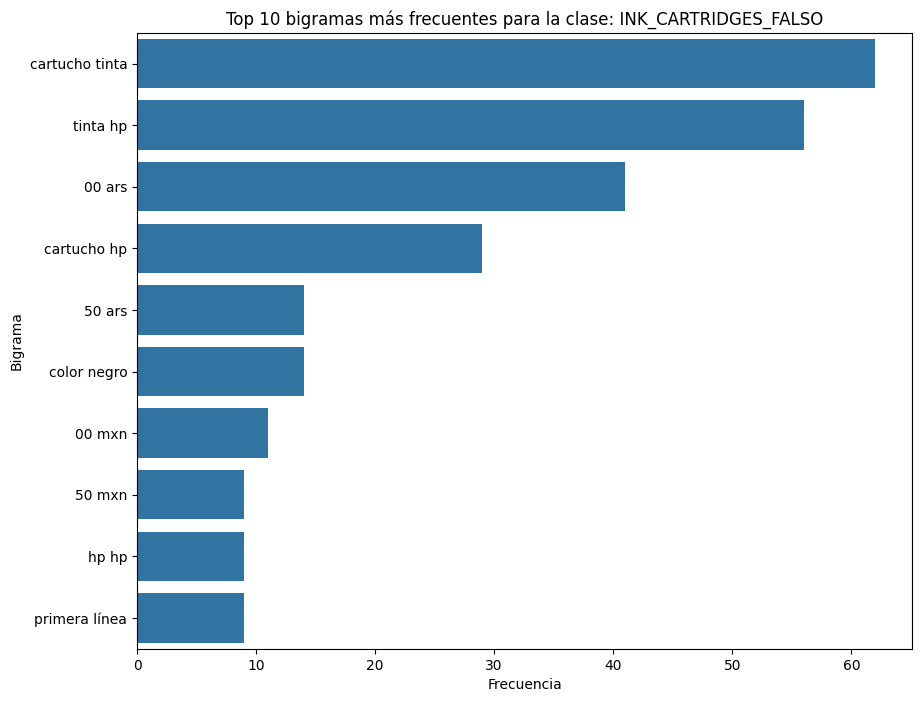

In [ ]:
#Biagramas más frecuentes

for i in train_df[target_feature].unique():
    palabras = train_df.loc[train_df[target_feature] == i, x_feature]
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words=stop_words)
    ngrams = vectorizer.fit_transform(palabras)

    sum_ngrams = np.array(ngrams.sum(axis=0)).flatten()
    feature_names = vectorizer.get_feature_names_out()
    words_freq = list(zip(feature_names, sum_ngrams))
    words_freq.sort(key=lambda x: x[1], reverse=True)

    df_bigram = pd.DataFrame(words_freq, columns=['Bigrama', 'Frecuencia'])
    top_bigrams = df_bigram.head(10)


    plt.figure(figsize=(10, 8))
    barplot = sns.barplot(x='Frecuencia', y='Bigrama', data=top_bigrams)
    barplot.set_title(f'Top 10 bigramas más frecuentes para la clase: {i}')
    barplot.set(xlabel='Frecuencia', ylabel='Bigrama')
    plt.show()

Los biagramas indican que ciertas frases de dos palabras dominan en diferentes contextos: "notebook lenovo" en Notebooks, "ray ban" en Sunglasses, "tarjeta memoria" en Memory cards, "gb ram" en cellphones y "reloj cassio" en WristWatches y "Portátil bluetooth" en Speakers. "color negro" en Headphones,
"Carolina herrera" en Perfumes, entre otras categorias. Estos bigramas destacan los temas prevalentes dentro de cada categoría, sugiriendo una concentración en tecnologia, moda y belleza.








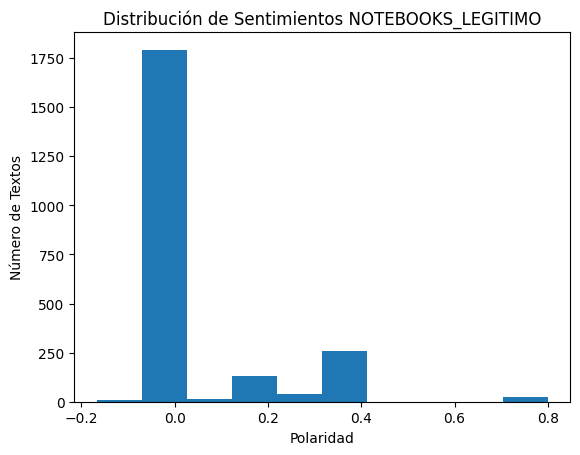

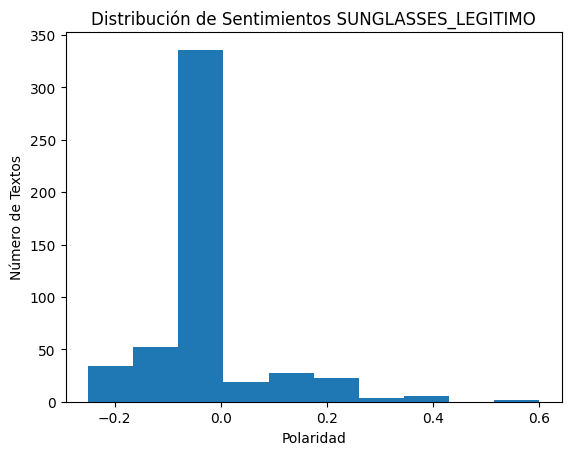

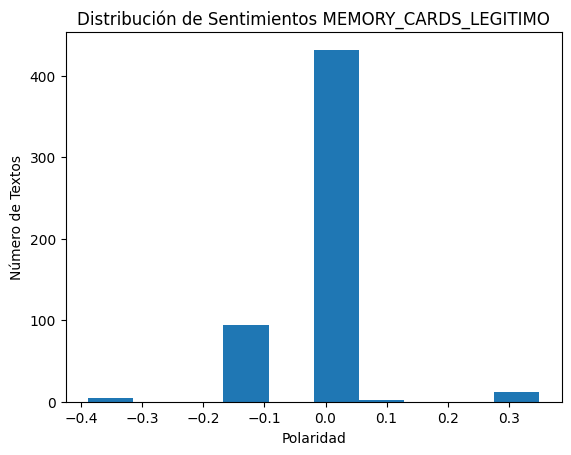

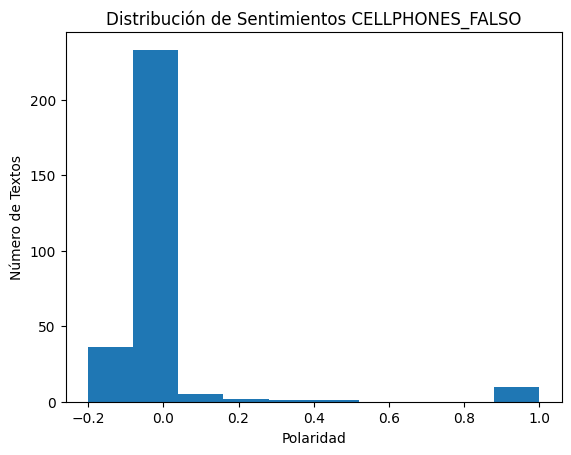

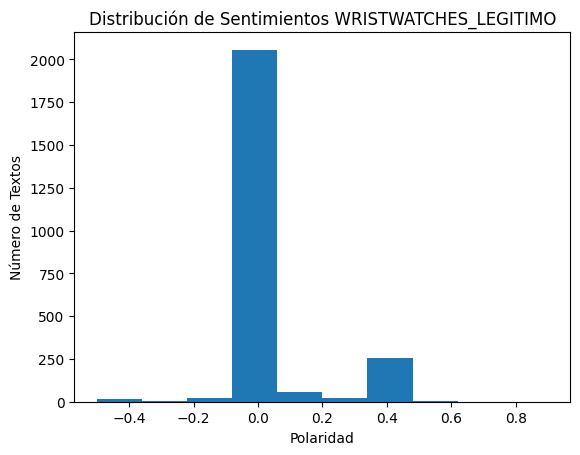

...

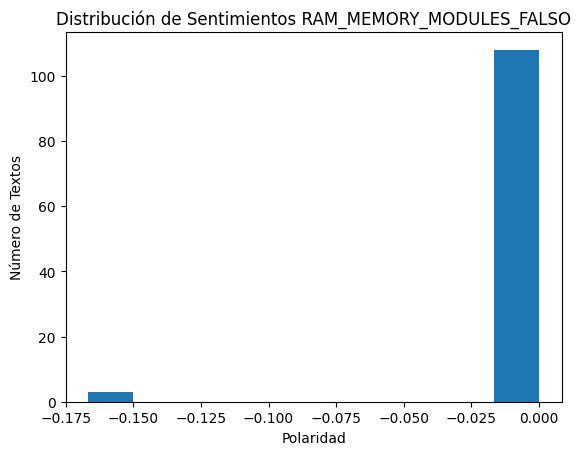

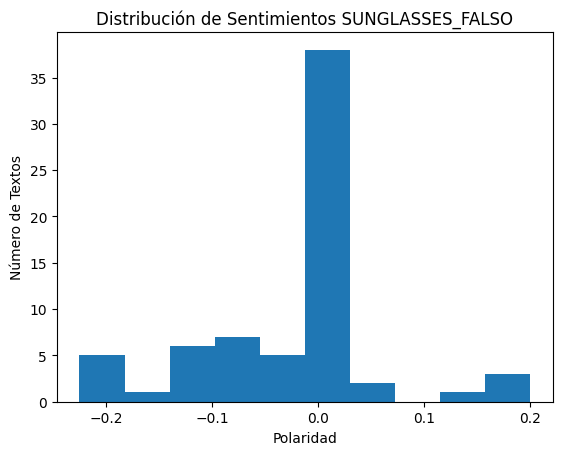

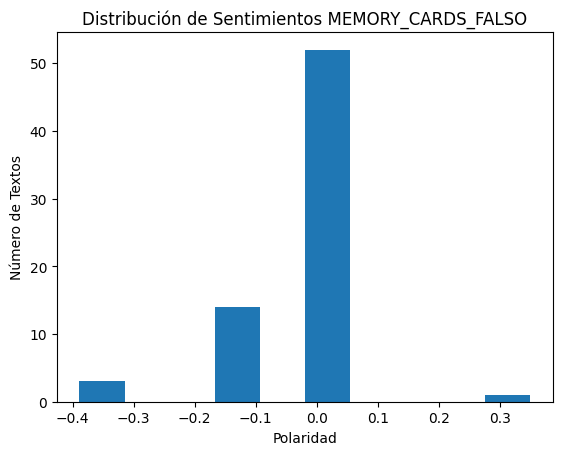

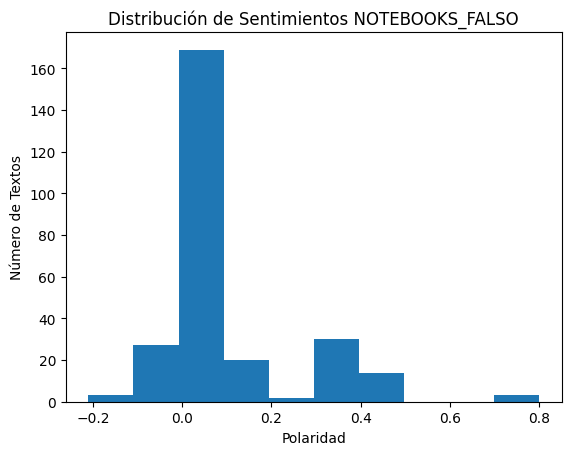

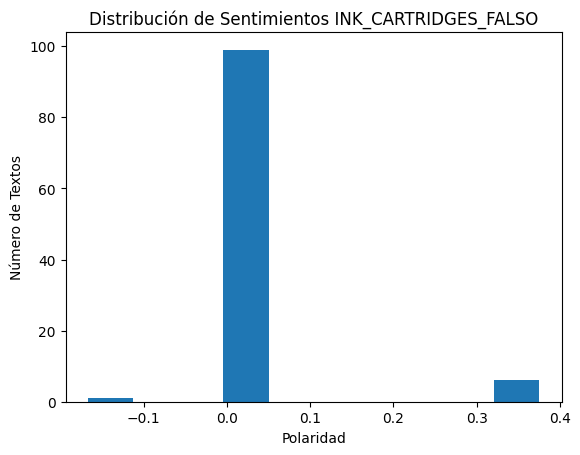

In [ ]:
from textblob import TextBlob
for i in train_df[target_feature].unique():

    palabras = train_df.loc[train_df[target_feature] == i, x_feature]
    sentiments = [TextBlob(str(phrase)).sentiment.polarity for phrase in palabras]
    plt.hist(sentiments, bins=10)
    title='Distribución de Sentimientos ' + i
    plt.title(title)
    plt.xlabel('Polaridad')
    plt.ylabel('Número de Textos')
    plt.show()


La polaridad se mide en un rango que va de negativo a positivo, donde valores más altos indican sentimientos más positivos. En general, los histogramas muestran una concentración de textos alrededor de la neutralidad, con una tendencia ligera hacia sentimientos positivos en todas las categorías, lo cual sugiere que, en promedio, los textos tienden a ser o neutrales o ligeramente positivos en su contenido emocional.

**Análisis y Preparación de Textos**

### 2.1 Codificación de temáticas.

In [ ]:
label_encoder = LabelEncoder()
train_df[target_feature] = label_encoder.fit_transform(train_df[target_feature])
test_df[target_feature] = label_encoder.fit_transform(test_df[target_feature])

unique_labels = label_encoder.classes_
for num_value, original_label in enumerate(unique_labels):
    print(f'Valor numérico: {num_value}, Etiqueta original: {original_label}')

Valor numérico: 0, Etiqueta original: CELLPHONES_FALSO
Valor numérico: 1, Etiqueta original: CELLPHONES_LEGITIMO
Valor numérico: 2, Etiqueta original: HEADPHONES_FALSO
Valor numérico: 3, Etiqueta original: HEADPHONES_LEGITIMO
Valor numérico: 4, Etiqueta original: INK_CARTRIDGES_FALSO
Valor numérico: 5, Etiqueta original: INK_CARTRIDGES_LEGITIMO
Valor numérico: 6, Etiqueta original: MEMORY_CARDS_FALSO
Valor numérico: 7, Etiqueta original: MEMORY_CARDS_LEGITIMO
Valor numérico: 8, Etiqueta original: NOTEBOOKS_FALSO
Valor numérico: 9, Etiqueta original: NOTEBOOKS_LEGITIMO
Valor numérico: 10, Etiqueta original: PERFUMES_FALSO
Valor numérico: 11, Etiqueta original: PERFUMES_LEGITIMO
Valor numérico: 12, Etiqueta original: RAM_MEMORY_MODULES_FALSO
Valor numérico: 13, Etiqueta original: RAM_MEMORY_MODULES_LEGITIMO
Valor numérico: 14, Etiqueta original: SPEAKERS_FALSO
Valor numérico: 15, Etiqueta original: SPEAKERS_LEGITIMO
Valor numérico: 16, Etiqueta original: SUNGLASSES_FALSO
Valor numérico: 

Obtenemos los valores en X e Y para cada uno de los casos:

In [ ]:
X_train, Y_train = train_df[x_feature], train_df[target_feature]
display(X_train)
Y_train

,Titulo_Precio
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12..."
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...
...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...
15702,Versace Versense Edt 50 Ml Para Mujer por 180....
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...


,Categoria_Fake
0,9
1,9
2,17
3,17
4,9
...,...
15701,13
15702,11
15703,19
15704,1


In [ ]:
X_test, Y_test = test_df[x_feature], test_df[target_feature]
display(X_test)
Y_test

,Titulo_Precio
0,Memoria Ram Valueram Color Verde 8gb 1 Kingsto...
1,Reloj Casio Gba-900rd-4a Rojo Bluetooth Watchc...
2,Notebook Lenovo Thinkbook 16 G6 Abp Amd Ryzen ...
3,Gafas De Sol Erika Rosa Ray-ban Originales por...
4,"Auriculares Jbl Tour Pro 2, Bluetooth, Negros ..."
...,...
3922,iPhone 12 Pro Max 128 Gb Azul Pacífico - Excel...
3923,Notebook Lenovo V15 Intel Core I3-1215u 16 Gb ...
3924,"Reloj Casio Mujer Ltp-e414d-1adf por 84.990,00..."
3925,Bocina Inalámbrica Portátil Srs-xb100 Color Az...


,Categoria_Fake
0,13
1,19
2,9
3,17
4,3
...,...
3922,1
3923,9
3924,19
3925,15


Para poder realizar el pre-procesamiento de los datos, es recomendable pasar por tres etapas:
* Eliminación del Ruido.
* Tokenización.
* Normalización.

### 2.2. Eliminación de ruido.

In [ ]:
def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

def replace_numbers(words):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words

def remove_stopwords(words, stopwords=stopwords.words('english')):
    """Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stopwords:
            new_words.append(word)
    return new_words

def preproccesing(words):
    words = to_lowercase(words)
    words = replace_numbers(words)
    words = remove_punctuation(words)
    words = remove_non_ascii(words)
    words = remove_stopwords(words)
    return words

### 2.3 Tokenización.

In [ ]:
X_train_new = X_train.apply(word_tokenize)
X_train_new = X_train_new.apply(preproccesing) #Aplica la eliminación del ruido
X_train_new.head()

,Titulo_Precio
0,"[notebook, hp, victus, gaming, 16s1023dx, amd,..."
1,"[notebook, hp, 15dy5885wm, 156, 256gb, 8gb, i5..."
2,"[gafas, de, sol, rayban, rb4438l666987, color,..."
3,"[gafas, de, sol, rayban, solar, rb3025l, talle..."
4,"[notebook, hp, gamer, 16xf0005la, r9, 32gb, 1t..."


In [ ]:
X_train_trans['trans'] = X_train_trans['Titulo_Precio'].apply(nltk.word_tokenize)

In [ ]:
X_train_trans['trans'] = X_train_trans['trans'].apply(preproccesing)
X_train_trans

,Titulo_Precio,Categoria_Fake,trans
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,NOTEBOOKS_LEGITIMO,"[notebook, hp, victus, gaming, 16s1023dx, amd,..."
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",NOTEBOOKS_LEGITIMO,"[notebook, hp, 15dy5885wm, 156, 256gb, 8gb, i5..."
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,SUNGLASSES_LEGITIMO,"[gafas, de, sol, rayban, rb4438l666987, color,..."
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,SUNGLASSES_LEGITIMO,"[gafas, de, sol, rayban, solar, rb3025l, talle..."
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,NOTEBOOKS_LEGITIMO,"[notebook, hp, gamer, 16xf0005la, r9, 32gb, 1t..."
...,...,...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...,RAM_MEMORY_MODULES_LEGITIMO,"[memoria, ram, color, verde, 8gb, one, kingsto..."
15702,Versace Versense Edt 50 Ml Para Mujer por 180....,PERFUMES_LEGITIMO,"[versace, versense, edt, fifty, ml, para, muje..."
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....,WRISTWATCHES_LEGITIMO,"[reloj, gshock, gm2110d2acr, correa, gris, por..."
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...,CELLPHONES_LEGITIMO,"[motorola, moto, e14, 64gb, gris, 2gb, ram, po..."


### 2.4. Normalización.

In [ ]:
def stem_words(words):
    """Stem words in list of tokenized words"""
    stemmer = SnowballStemmer('english')
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems

def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

def stem_and_lemmatize(words):
    words = stem_words(words)
    words = lemmatize_verbs(words)
    return words

In [ ]:
X_train_new = X_train_new.apply(stem_and_lemmatize) #Aplica lematización y Eliminación de Prefijos y Sufijos.
X_train_new.head()

,Titulo_Precio
0,"[notebook, hp, victus, game, 16s1023dx, amd, r..."
1,"[notebook, hp, 15dy5885wm, 156, 256gb, 8gb, i5..."
2,"[gafa, de, sol, rayban, rb4438l666987, color, ..."
3,"[gafa, de, sol, rayban, solar, rb3025l, tall, ..."
4,"[notebook, hp, gamer, 16xf0005la, r9, 32gb, 1t..."


In [ ]:
X_train_trans['trans'] = X_train_trans['trans'].apply(stem_words)
X_train_trans

,Titulo_Precio,Categoria_Fake,trans
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,NOTEBOOKS_LEGITIMO,"[notebook, hp, victus, game, 16s1023dx, amd, r..."
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",NOTEBOOKS_LEGITIMO,"[notebook, hp, 15dy5885wm, 156, 256gb, 8gb, i5..."
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,SUNGLASSES_LEGITIMO,"[gafa, de, sol, rayban, rb4438l666987, color, ..."
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,SUNGLASSES_LEGITIMO,"[gafa, de, sol, rayban, solar, rb3025l, tall, ..."
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,NOTEBOOKS_LEGITIMO,"[notebook, hp, gamer, 16xf0005la, r9, 32gb, 1t..."
...,...,...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...,RAM_MEMORY_MODULES_LEGITIMO,"[memoria, ram, color, verd, 8gb, one, kingston..."
15702,Versace Versense Edt 50 Ml Para Mujer por 180....,PERFUMES_LEGITIMO,"[versac, versens, edt, fifti, ml, para, mujer,..."
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....,WRISTWATCHES_LEGITIMO,"[reloj, gshock, gm2110d2acr, correa, gris, por..."
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...,CELLPHONES_LEGITIMO,"[motorola, moto, e14, 64gb, gris, 2gb, ram, po..."


**Cálculo del total de palabras por artículo**

In [ ]:
X_train_trans['trans_count'] = X_train_trans['trans'].apply(lambda x: len(x))
X_train_trans

,Titulo_Precio,Categoria_Fake,trans,trans_count
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,NOTEBOOKS_LEGITIMO,"[notebook, hp, victus, game, 16s1023dx, amd, r...",38
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",NOTEBOOKS_LEGITIMO,"[notebook, hp, 15dy5885wm, 156, 256gb, 8gb, i5...",13
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,SUNGLASSES_LEGITIMO,"[gafa, de, sol, rayban, rb4438l666987, color, ...",10
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,SUNGLASSES_LEGITIMO,"[gafa, de, sol, rayban, solar, rb3025l, tall, ...",17
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,NOTEBOOKS_LEGITIMO,"[notebook, hp, gamer, 16xf0005la, r9, 32gb, 1t...",12
...,...,...,...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...,RAM_MEMORY_MODULES_LEGITIMO,"[memoria, ram, color, verd, 8gb, one, kingston...",11
15702,Versace Versense Edt 50 Ml Para Mujer por 180....,PERFUMES_LEGITIMO,"[versac, versens, edt, fifti, ml, para, mujer,...",10
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....,WRISTWATCHES_LEGITIMO,"[reloj, gshock, gm2110d2acr, correa, gris, por...",8
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...,CELLPHONES_LEGITIMO,"[motorola, moto, e14, 64gb, gris, 2gb, ram, po...",10


Número promedio de tokens:

In [ ]:
X_train_trans['trans_count'].mean()

15.123710683815103

In [ ]:
train_df['trans'] = X_train_new.apply(lambda x: ' '.join(map(str, x)))
train_df

,Titulo_Precio,Categoria_Fake,trans
0,Notebook Hp Victus Gaming 16-s1023dx Amd Ryzen...,9,notebook hp victus game 16s1023dx amd ryzen se...
1,"Notebook Hp 15-dy5885wm 15,6 256gb / 8gb I5-12...",9,notebook hp 15dy5885wm 156 256gb 8gb i51235u w...
2,Gafas De Sol Ray-ban Rb4438l666987 Color Azul ...,17,gafa de sol rayban rb4438l666987 color azul po...
3,Gafas De Sol Ray-ban Solar Rb3025l Talle Stand...,17,gafa de sol rayban solar rb3025l tall standard...
4,Notebook Hp Gamer 16-xf0005la R9 32gb 1tb Rtx4...,9,notebook hp gamer 16xf0005la r9 32gb 1tb rtx40...
...,...,...,...
15701,Memoria Ram Color Verde 8gb 1 Kingston Kcp432s...,13,memoria ram color verd 8gb one kingston kcp432...
15702,Versace Versense Edt 50 Ml Para Mujer por 180....,11,versac versens edt fifti ml para mujer por 180...
15703,Reloj G-shock Gm-2110d-2acr Correa Gris por 8....,19,reloj gshock gm2110d2acr correa gris por 88360...
15704,Motorola Moto E14 64gb Gris 2gb Ram por 199.99...,1,motorola moto e14 64gb gris 2gb ram por 199999...


Primero, se transforma el texto con una transformación binaria 1 a 1.

In [ ]:
dummy = CountVectorizer(binary=True)
X_dummy = dummy.fit_transform(train_df['trans'])
print(X_dummy.shape)
X_dummy[0]

(15706, 14645)


<1x14645 sparse matrix of type '<class 'numpy.int64'>'
	with 42 stored elements in Compressed Sparse Row format>

También, se puede realizar el conteo de las palabras presentes.

In [ ]:
count = CountVectorizer()
X_count = count.fit_transform(train_df['trans'])
print(X_count.shape)

(15706, 14645)


In [ ]:
tfidf_vect = TfidfVectorizer()

In [ ]:
X_train_new_v = X_train_new.apply(lambda words: ' '.join(words))
X_tfidf = tfidf_vect.fit_transform(X_train_new_v)

In [ ]:
X_tfidf.shape

(15706, 14645)

Las categorías del proceso de vectorización son las siguientes:

In [ ]:
terms = tfidf_vect.get_feature_names_out()
print(f"El número de columnas es: {len(terms)}")
terms

El número de columnas es: 14645


array(['00113', '00158', '00186', ..., 'zona', 'zx', 'zx310ap'],
      dtype=object)

In [ ]:
tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=terms)
tfidf_df

,00113,00158,00186,0025162,00258,0028g,002b1,003l,00451,0047158,...,z3200,za9a0014ww,zafiro,zbook,zbw4355ti,zena,zero,zona,zx,zx310ap
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15702,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15703,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Análisis Exploratorio de Componentes Principales**

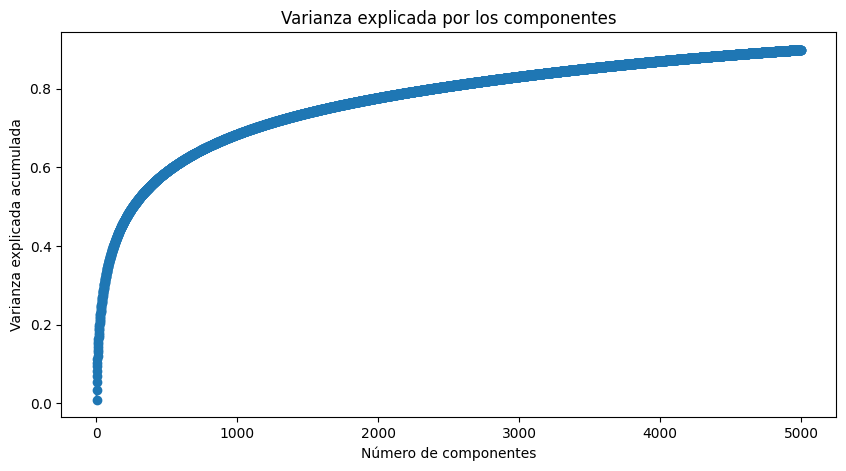

In [ ]:
#Exploración de la varianza explicada por cada componente
with tf.device('/device:GPU:0'):
  svd = TruncatedSVD(n_components=5000)
  X_reduced = svd.fit_transform(X_tfidf)


plt.figure(figsize=(10, 5))
plt.plot(range(1, 5001), svd.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Varianza explicada por los componentes')
plt.xlabel('Número de componentes')
plt.ylabel('Varianza explicada acumulada')
plt.show()

Esta curva ascendente indica que a medida que se incluyen más componentes en el modelo, se explica una mayor proporción de la varianza total de los datos. Observamos un rápido crecimiento al principio, lo que sugiere que los primeros componentes capturan la mayoría de la varianza. Luego, la curva se aplana, lo que indica que cada componente adicional contribuye cada vez menos a la explicación de la varianza total. Este tipo de análisis se utiliza a menudo para determinar el número de componentes que se deben retener para capturar una cantidad sustancial de la información sin tener que utilizar todos los componentes, optimizando así la complejidad del modelo frente a la información explicada.

In [ ]:
varianza_acumulada = svd.explained_variance_ratio_.cumsum()

indices = range(199, len(varianza_acumulada), 200)
varianza_cada_200 = [(i+1, varianza_acumulada[i]) for i in indices]

tabla_varianza = pd.DataFrame(varianza_cada_200, columns=["Número de Componentes", "Varianza Explicada Acumulada"])

tabla_varianza

,Número de Componentes,Varianza Explicada Acumulada
0,200,0.465483
1,400,0.559067
2,600,0.614631
3,800,0.653986
4,1000,0.684449
5,1200,0.709129
6,1400,0.729838
7,1600,0.747628
8,1800,0.763202
9,2000,0.777096


Se puede destacar que el incremento de varianza explicada se desacelera a medida que se añaden más componentes. Por ejemplo, al pasar de 1200 a 1400 componentes, la varianza explicada acumulada solo aumenta aproximadamente un 2%. Sin embargo, desde 200 a 400 componentes, el incremento es de aproximadamente 9%. Esto muestra que los primeros componentes son los que capturan la mayoría de las características significativas de los datos. A medida que se añaden más componentes, cada uno añade menos información nueva.

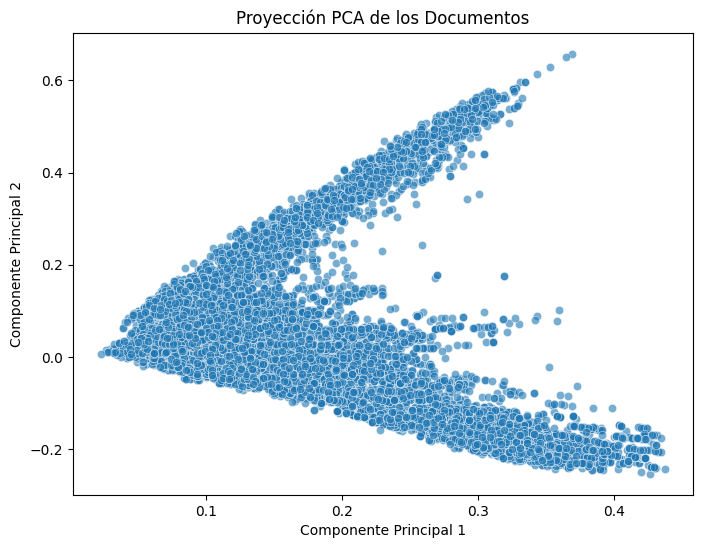

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], alpha=0.6)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('Proyección PCA de los Documentos')
plt.show()

El Componente Principal 1 tiene una distribución más estrecha en comparación con el Componente Principal 2, lo que indica que la variabilidad más significativa entre los documentos se puede encontrar a lo largo del Componente Principal 2.

In [ ]:
with tf.device('/device:GPU:0'):
  svd_final = TruncatedSVD(n_components=5000)
  X_reduced_final = svd_final.fit_transform(X_tfidf)

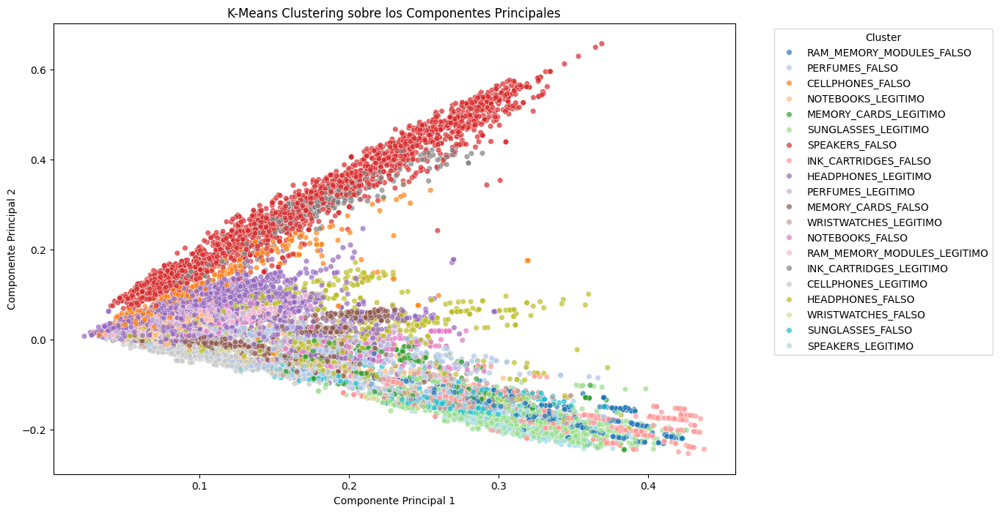

In [ ]:
# Aplicar K-Means con 20 clusters
kmeans = KMeans(n_clusters=20, random_state=42)
clusters = kmeans.fit_predict(X_reduced_final)

# Asignar etiquetas a los clusters
cluster_labels = {i: label for i, label in enumerate(unique_labels)}
cluster_names = [cluster_labels[i] for i in clusters]

# Crear la figura con mayor tamaño
plt.figure(figsize=(12, 8))

# Visualización con paleta de colores mejor diferenciada
sns.scatterplot(x=X_reduced_final[:, 0], y=X_reduced_final[:, 1], hue=cluster_names, palette='tab20', s=30, alpha=0.7)

# Ajustar título y ejes
plt.title('K-Means Clustering sobre los Componentes Principales')
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')

# Mover la leyenda fuera del gráfico
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Mostrar el gráfico
plt.show()


**Patrones de Agrupación Definidos:**
Se pueden identificar varias agrupaciones dentro del espacio reducido de los componentes principales. En particular, se observa una separación clara de un grupo predominante en la parte superior (rojo), que corresponde a productos falsificados de varias categorías, lo que sugiere que estos productos comparten características similares.

**Diferenciación Parcial entre Legítimos y Falsos:**
Aunque hay algunas superposiciones, ciertas categorías de productos falsificados parecen formar grupos bien diferenciados de sus contrapartes legítimas.

Los productos falsificados (principalmente en rojo y naranja) se agrupan en una zona específica, lo que indica que tienen características comunes que los diferencian de los productos legítimos.
Los productos legítimos están más dispersos, lo que podría deberse a una mayor variedad en sus descripciones y precios.

**Mayor Separabilidad en Algunas Categorías:**

Cellphones, Perfumes y Wristwatches Falsificados forman grupos más compactos y diferenciados, lo que sugiere que los criterios de falsificación en estas categorías son más homogéneos.
Speakers, Sunglasses y Memory Cards muestran una mayor superposición entre legítimos y falsificados, lo que puede indicar que sus patrones de falsificación son menos consistentes.

**Superposición entre Clases:**
A pesar de la separación observada, hay zonas donde las categorías legítimas y falsificadas se mezclan, lo que podría indicar que algunos productos falsificados tienen descripciones y precios similares a los legítimos, dificultando su detección basada solo en estos atributos.

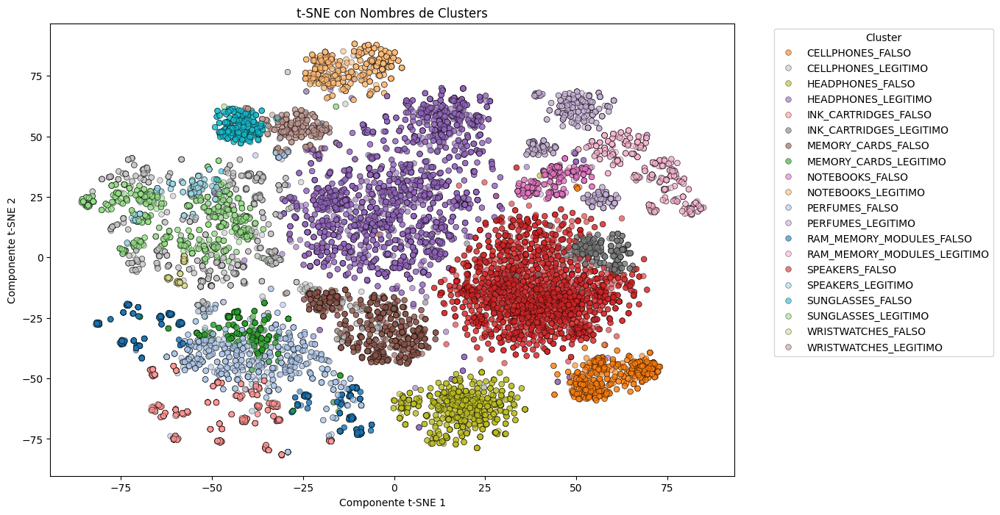

In [ ]:
# Aplicación de t-SNE
with tf.device('/device:GPU:0'):
  tsne = TSNE(n_components=2, random_state=42, perplexity=50, learning_rate=200)
  X_tsne = tsne.fit_transform(X_reduced_final)

  # Verificar si los clusters coinciden con las etiquetas únicas
  if len(unique_labels) == len(set(clusters)):
      cluster_labels = {i: label for i, label in enumerate(unique_labels)}
      cluster_names = [cluster_labels[cluster] for cluster in clusters]

      plt.figure(figsize=(12, 8))

      sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=cluster_names,
                      palette='tab20', s=30, alpha=0.6, edgecolor="black")

      plt.title('t-SNE con Nombres de Clusters')
      plt.xlabel('Componente t-SNE 1')
      plt.ylabel('Componente t-SNE 2')

      handles, labels = plt.gca().get_legend_handles_labels()
      labels, handles = zip(*sorted(zip(labels, handles)))  # Ordenar la leyenda
      plt.legend(handles, labels, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
      plt.show()
  else:
      print("La cantidad de unique_labels no coincide con el número de clusters generados por k-means.")


**Mayor Separabilidad de los Clusters:**

A diferencia del análisis con K-Means, aquí se observa una mejor separación entre categorías. Esto sugiere que t-SNE captura patrones más complejos en los datos, ayudando a diferenciar mejor ciertos tipos de productos.
Se pueden identificar varios grupos compactos, lo que indica que los productos de cada categoría tienden a compartir similitudes en sus descripciones y precios.

**Diferenciación más Clara entre Productos Legítimos y Falsificados:**

- Productos falsificados de "Cellphones", "Wristwatches" y "Perfumes" (colores cálidos como rojo y naranja) están fuertemente agrupados, lo que sugiere que comparten características comunes que los diferencian de los legítimos.
Los productos legítimos presentan más dispersión en algunas categorías, indicando una mayor variabilidad en sus descripciones y precios.
Zonas de Superposición:

- Aunque la mayoría de las categorías muestran una separación clara, existen algunas áreas donde los productos legítimos y falsificados parecen mezclarse.
Esto sugiere que en ciertos casos, las diferencias entre un producto legítimo y uno falso pueden no ser tan evidentes solo con la descripción y el precio.
Tendencias por Categoría:

- Cellphones, Wristwatches y Perfumes Falsificados tienen grupos muy definidos y compactos, lo que podría facilitar su detección con un modelo de clasificación.
Categorías como "Speakers", "Memory Cards" y "Sunglasses" muestran más dispersión entre productos falsificados y legítimos, lo que indica que en estos casos puede ser más difícil identificar falsificaciones solo con estos atributos.

**Conclusión:**
El análisis con t-SNE muestra que los productos falsificados de ciertas categorías pueden agruparse bien, lo que indica patrones consistentes en sus descripciones y precios. Sin embargo, existen categorías con mayor superposición entre legítimos y falsificados, lo que sugiere que un modelo basado solo en estas características podría no ser suficiente en todos los casos.
Este resultado respalda la necesidad de utilizar un modelo de TF-IDF con redes neuronales para evaluar si el texto de la descripción del producto, combinado con el precio, puede mejorar la precisión en la identificación de productos falsificados.

## **Construcción de la Red Neuronal con los Componentes Principales**

**Pipeline de Procesamiento de textos**

In [ ]:
class TextPreprocessing():
    def __init__(self,stopwords=stopwords.words('english')):
        self.stopwords = stopwords

    def remove_non_ascii(self, words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words

    def to_lowercase(self, words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words

    def remove_punctuation(self, words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words

    def replace_numbers(self, words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words

    def remove_stopwords(self, words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in self.stopwords:
                new_words.append(word)
        return new_words

    def stem_words(self, words):
        """Stem words in list of tokenized words"""
        stemmer = SnowballStemmer('spanish')
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems

    def lemmatize_verbs(self, words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas

    def stem_and_lemmatize(self, words):
        words = self.stem_words(words)
        words = self.lemmatize_verbs(words)
        return words

    def preproccesing(self, words):
        words = self.to_lowercase(words)
        words = self.replace_numbers(words)
        words = self.remove_punctuation(words)
        words = self.remove_non_ascii(words)
        words = self.remove_stopwords(words)
        return words

    def transform(self, X_train, X_test, n_components):
    # Preprocesamiento y tokenización
        X_train_new = pd.Series(X_train)
        X_test_new = pd.Series(X_test)
        X_train_new = X_train_new.apply(contractions.fix)
        X_test_new = X_test_new.apply(contractions.fix)
        X_train_new = X_train_new.apply(word_tokenize)
        X_test_new = X_test_new.apply(word_tokenize)
        X_train_new = X_train_new.apply(lambda x: self.preproccesing(x))
        X_test_new = X_test_new.apply(lambda x: self.preproccesing(x))
        X_train_new = X_train_new.apply(lambda x: self.stem_and_lemmatize(x))
        X_test_new = X_test_new.apply(lambda x: self.stem_and_lemmatize(x))
        X_train_new = X_train_new.apply(lambda x: self.stem_words(x))
        X_test_new = X_test_new.apply(lambda x: self.stem_words(x))
        X_train_new = X_train_new.apply(lambda x: ' '.join(map(str, x)))
        X_test_new = X_test_new.apply(lambda x: ' '.join(map(str, x)))

    # Ajustar y transformar TfidfVectorizer solo en los datos de entrenamiento
        tfidf_vect = TfidfVectorizer()
        X_train_tfidf = tfidf_vect.fit_transform(X_train_new)

        # Transformar los datos de prueba utilizando el modelo ajustado de TfidfVectorizer
        X_test_tfidf = tfidf_vect.transform(X_test_new)

        # Ajustar TruncatedSVD solo en los datos de entrenamiento transformados por TfidfVectorizer
        pca = TruncatedSVD(n_components=n_components)
        X_train_pca = pca.fit_transform(X_train_tfidf)

        # Transformar los datos de prueba utilizando el modelo ajustado de TruncatedSVD
        X_test_pca = pca.transform(X_test_tfidf)

        return X_train_pca, X_test_pca

In [ ]:
pipeline= TextPreprocessing()

In [ ]:
with tf.device('/device:GPU:0'):
  X_final=pipeline.transform(X_train,X_test,5000)

In [ ]:
X_final[1].shape

(3927, 5000)

In [ ]:
X_train_PCA=X_final[0]
print(f"El tamaño es: {X_train_PCA.shape}")

El tamaño es: (15706, 5000)


In [ ]:
X_test_PCA=X_final[1]
print(f"El tamaño es: {X_test_PCA.shape}")

El tamaño es: (3927, 5000)


In [ ]:
unique_classes = np.unique(train_df["Categoria_Fake"])

# 🔹 Modelo con Regularización Más Fuerte
model2 = Sequential(name="Regularized_NN")

# Capa de entrada
model2.add(Dense(512, activation='relu', input_shape=(X_train_PCA.shape[1],), kernel_regularizer=l2(0.02)))
model2.add(BatchNormalization())  # 🔥 Normalización
model2.add(Dropout(0.6))  # 🔥 Más Dropout

# Capa oculta
model2.add(Dense(256, activation='relu', kernel_regularizer=l2(0.02)))
model2.add(BatchNormalization())  # 🔥 Normalización
model2.add(Dropout(0.8))  # 🔥 Más Dropout

# Capa de salida
model2.add(Dense(len(unique_classes), activation='softmax'))

# 🔹 Compilación con `learning_rate` Ajustado
optimizer = Adam(learning_rate=1e-8)  # 🔥 Reducimos `learning_rate`

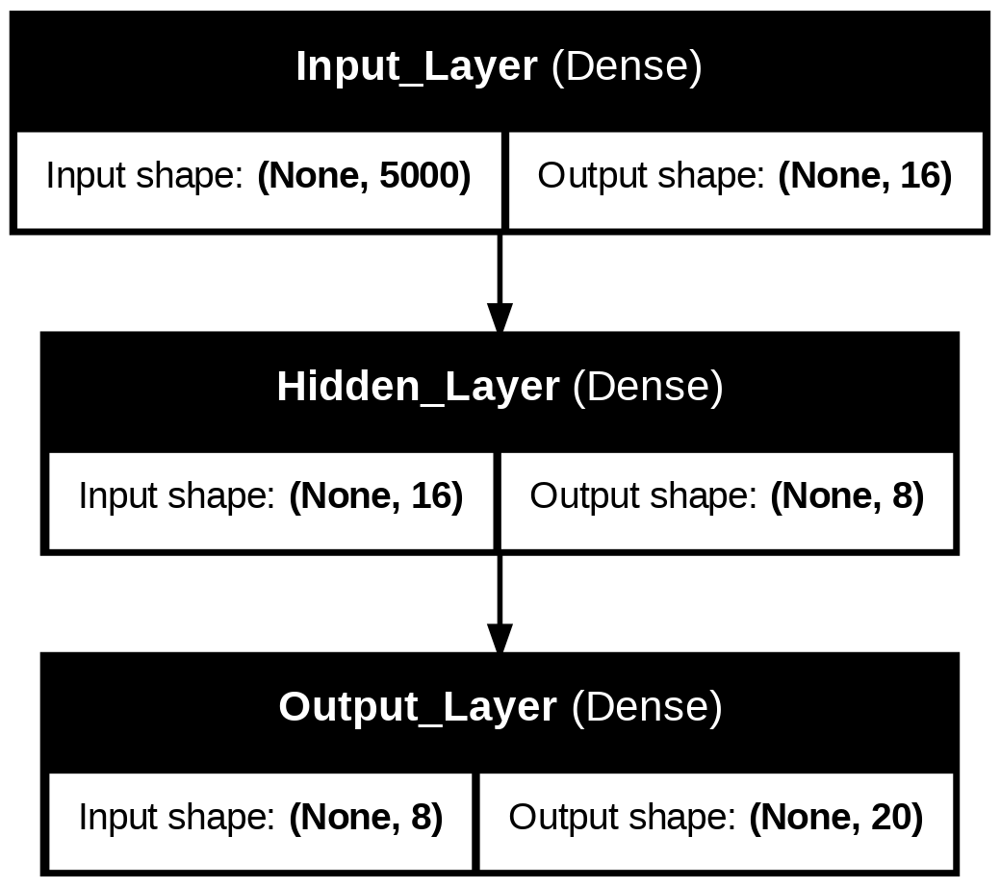

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
early_stopping_pca = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)

In [ ]:


# 🔹 Calcular pesos de clase automáticament
class_weights = compute_class_weight(class_weight="balanced", classes=unique_classes, y=train_df["Categoria_Fake"])

# 🔹 Suavizar los pesos para evitar sobreajuste
class_weights_smooth = {cls: min(weight, 3.0) for cls, weight in zip(unique_classes, class_weights)}  # 🔥 Limitamos pesos a 3.0

# 🔹 Imprimir pesos de clase ajustados
print("\n✅ Pesos de Clase Ajustados:")
print(class_weights_smooth)


✅ Pesos de Clase Ajustados:
{0: 2.7267361111111112, 1: 0.32277024249897246, 2: 2.9193308550185875, 3: 0.3956171284634761, 4: 3.0, 5: 1.0093830334190232, 6: 3.0, 7: 1.4435661764705883, 8: 2.930223880597015, 9: 0.3460996033494932, 10: 3.0, 11: 0.554982332155477, 12: 3.0, 13: 0.8823595505617977, 14: 3.0, 15: 1.0967877094972067, 16: 3.0, 17: 1.5643426294820717, 18: 2.566339869281046, 19: 0.3229029605263158}


In [ ]:
with tf.device('/device:GPU:0'):
  history = model.fit(X_train_PCA, Y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=2, callbacks=[early_stopping_pca])

Epoch 1/100
393/393 - 1s - 3ms/step - accuracy: 0.9836 - loss: 0.0419 - val_accuracy: 0.8845 - val_loss: 0.8368
Epoch 2/100
393/393 - 1s - 3ms/step - accuracy: 0.9826 - loss: 0.0420 - val_accuracy: 0.8768 - val_loss: 0.8174
Epoch 3/100
393/393 - 1s - 3ms/step - accuracy: 0.9823 - loss: 0.0416 - val_accuracy: 0.8842 - val_loss: 0.8496
Epoch 4/100
393/393 - 1s - 3ms/step - accuracy: 0.9838 - loss: 0.0403 - val_accuracy: 0.8819 - val_loss: 0.8390
Epoch 5/100
393/393 - 1s - 3ms/step - accuracy: 0.9835 - loss: 0.0407 - val_accuracy: 0.8842 - val_loss: 0.8584
Epoch 6/100
393/393 - 1s - 3ms/step - accuracy: 0.9834 - loss: 0.0404 - val_accuracy: 0.8816 - val_loss: 0.8690
Epoch 7/100
393/393 - 1s - 3ms/step - accuracy: 0.9840 - loss: 0.0399 - val_accuracy: 0.8768 - val_loss: 0.8529
Epoch 8/100
393/393 - 1s - 3ms/step - accuracy: 0.9841 - loss: 0.0396 - val_accuracy: 0.8873 - val_loss: 0.9145
Epoch 9/100
393/393 - 1s - 3ms/step - accuracy: 0.9850 - loss: 0.0395 - val_accuracy: 0.8791 - val_loss:

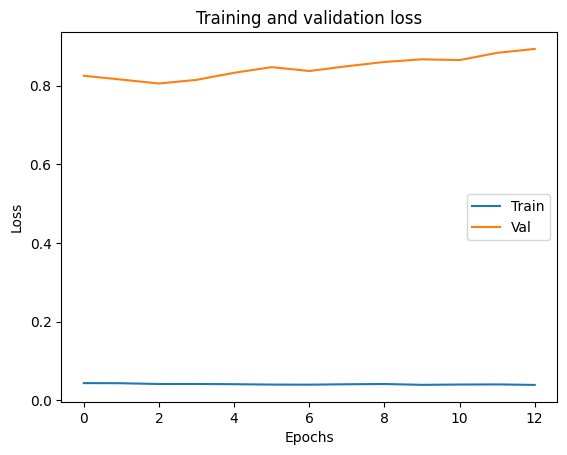

In [ ]:
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

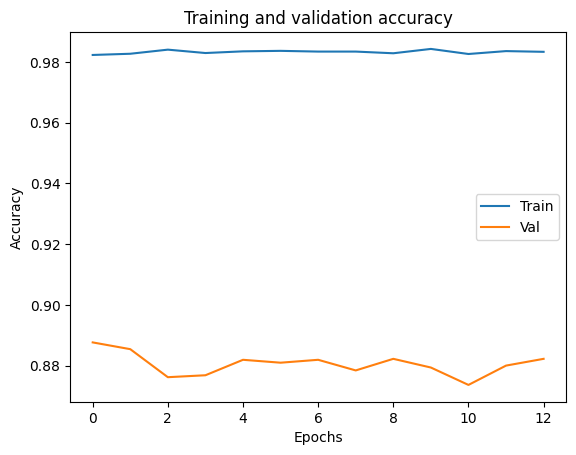

In [ ]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

 **Observaciones:**

La pérdida en entrenamiento se mantiene constantemente baja, lo que indica que el modelo ajusta bien los datos de entrenamiento.
Sin embargo, la pérdida en validación es significativamente más alta y parece aumentar progresivamente con cada época.

**Interpretación**:

- Sobreajuste (Overfitting):
El modelo ha aprendido muy bien los datos de entrenamiento, pero no generaliza bien en los datos de validación, lo que sugiere sobreajuste.
Posibles soluciones:
Aplicar regularización (L1/L2) o Dropout en las capas del modelo.
Aumentar la cantidad de datos de entrenamiento para mejorar la generalización.
Implementar Early Stopping para detener el entrenamiento antes de que la validación empeore demasiado.

In [ ]:
model_accuracy_PCA = model.evaluate(X_train_PCA, Y_train)
print(f"Train Accuracy: {model_accuracy_PCA[1]}")

491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9820 - loss: 0.0571
Train Accuracy: 0.9627531170845032


In [ ]:
model_accuracy_PCA = model.evaluate(X_test_PCA, Y_test)
print(f"Test Accuracy: {model_accuracy_PCA[1]}")

123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9049 - loss: 0.5801
Test Accuracy: 0.9017061591148376


123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


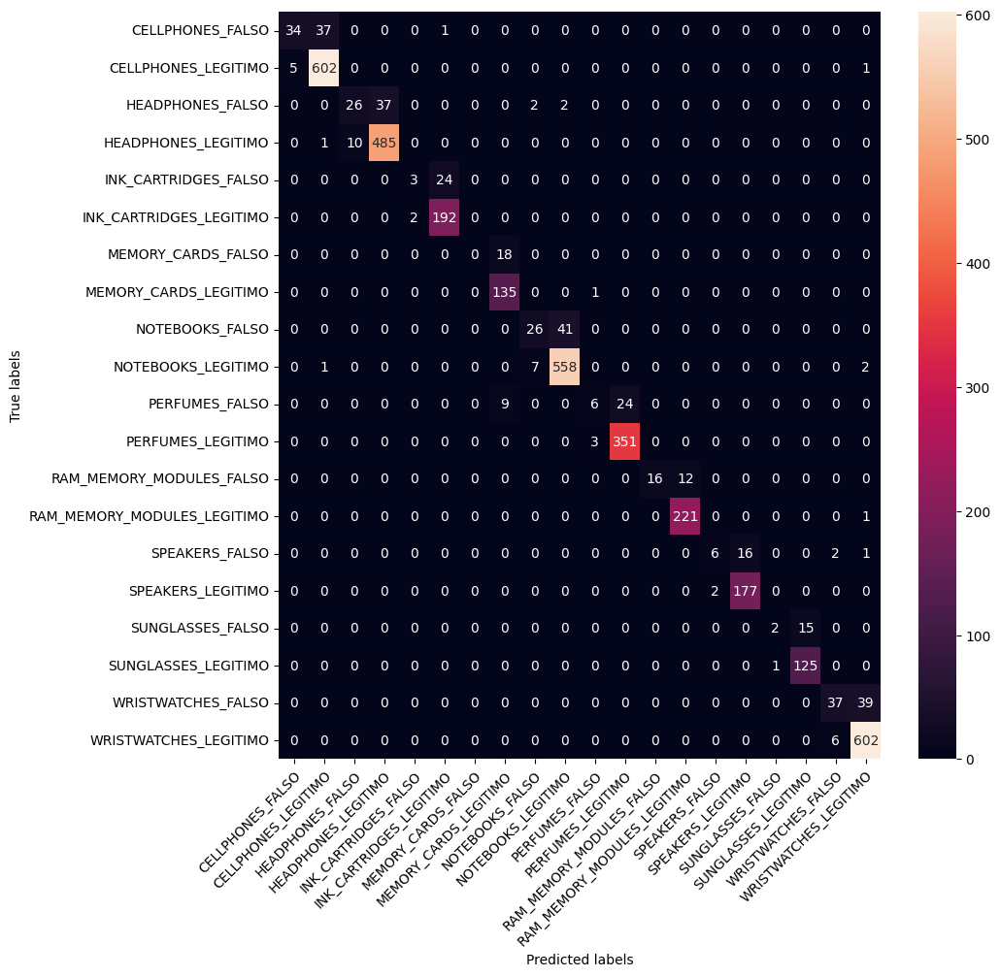

In [ ]:
# Matriz de confusión Modelo Base
predictions_model1 = model.predict(X_test_PCA)
predicted_classes_model1 = np.argmax(predictions_model1, axis=1)

predicted_labels_model1 = label_encoder.inverse_transform(predicted_classes_model1)
true_labels = label_encoder.inverse_transform(Y_test)

cm_model1 = confusion_matrix(true_labels, predicted_labels_model1)

label_mapping = {num_value: original_label for num_value, original_label in enumerate(unique_labels)}

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm_model1, annot=True, fmt='d', ax=ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')

ax.set_xticklabels([label_mapping[num] for num in range(len(unique_labels))])
ax.set_yticklabels([label_mapping[num] for num in range(len(unique_labels))])

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor")
plt.show()

El modelo tiene un buen desempeño en varias categorías, con la mayoría de las predicciones en la diagonal principal, lo que indica que la clasificación es acertada en esos casos.

Ejemplos notables de categorías con alta precisión:

Cellphones_Legítimo (602 correctamente clasificados)
Notebooks_Legítimo (558 correctamente clasificados)
Perfumes_Legítimo (351 correctamente clasificados)
Wristwatches_Legítimo (392 correctamente clasificados)
RAM_Memory_Modules_Legítimo (221 correctamente clasificados)
- Para estas categorías, el modelo ha logrado capturar características que diferencian los productos legítimos de los falsificados.

In [ ]:
#  Recalcular Pesos de Clases
class_weights = compute_class_weight(class_weight="balanced",
                                     classes=np.unique(train_df["Categoria_Fake"]),
                                     y=train_df["Categoria_Fake"])

class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}

# Modelo Mejorado con `TF-IDF`
model2 = Sequential(name="Improved_NN_TFIDF")

# Capa de Entrada
model2.add(Dense(256, activation='relu', input_shape=(X_train_PCA.shape[1],),
                 kernel_regularizer=l2(0.005), name="Input_Layer"))
model2.add(BatchNormalization())
model2.add(Dropout(0.4))

# Segunda Capa Oculta
model2.add(Dense(128, activation='relu', kernel_regularizer=l2(0.003), name="Hidden_Layer_1"))
model2.add(BatchNormalization())
model2.add(Dropout(0.3))

# Tercera Capa Oculta
model2.add(Dense(64, activation='relu', kernel_regularizer=l2(0.003), name="Hidden_Layer_2"))
model2.add(BatchNormalization())
model2.add(Dropout(0.3))

# Capa de Salida
model2.add(Dense(len(np.unique(train_df["Categoria_Fake"])), activation='softmax', name='Output_Layer'))

# Compilación del Modelo con Tasa de Aprendizaje Ajustada
optimizer = Adam(learning_rate=5e-4)  # Ajustamos `learning_rate` a un valor más alto

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model2.summary()

Model: "Improved_NN_TFIDF"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Input_Layer (Dense)                  │ (None, 256)                 │       1,280,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Hidden_Layer_1 (Dense)               │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Hidden_Layer_2 (Dense)               │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output_Layer (Dense)                 │ (None, 20)                  │           1,300 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,324,500 (5.05 MB)

 Trainable params: 1,323,604 (5.05 MB)

 Non-trainable params: 896 (3.50 KB)

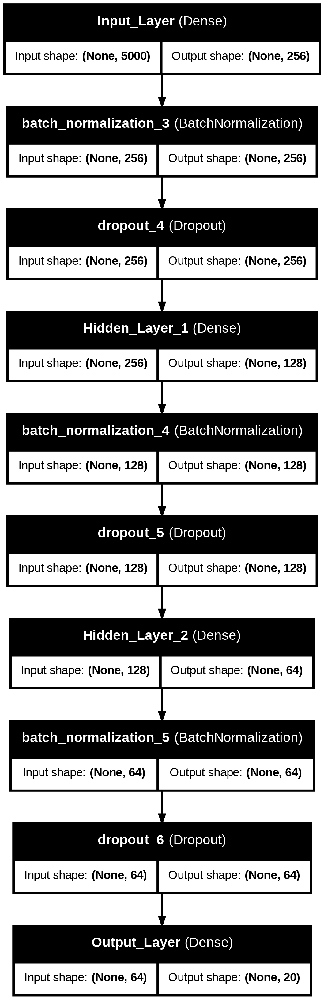

In [ ]:
plot_model(model2, show_shapes=True, show_layer_names=True)

In [ ]:
early_stopping_pca = EarlyStopping(monitor='val_loss', patience=30, verbose=1, restore_best_weights=True)

In [ ]:
model2.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


In [ ]:
# Calcular los pesos de cada clase
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(Y_train), y=Y_train)
class_weights_dict = dict(enumerate(class_weights))

In [ ]:
with tf.device('/device:GPU:0'):
  history = model2.fit(X_train_PCA, Y_train, validation_split=0.2, epochs=5, batch_size=32, verbose=2, callbacks=[early_stopping_pca])

Epoch 1/5
393/393 - 8s - 22ms/step - accuracy: 0.6576 - loss: 4.2575 - val_accuracy: 0.7813 - val_loss: 3.7471
Epoch 2/5
393/393 - 1s - 3ms/step - accuracy: 0.8772 - loss: 2.4368 - val_accuracy: 0.8861 - val_loss: 1.9208
Epoch 3/5
393/393 - 1s - 3ms/step - accuracy: 0.9054 - loss: 1.5960 - val_accuracy: 0.9093 - val_loss: 1.3396
Epoch 4/5
393/393 - 1s - 3ms/step - accuracy: 0.9191 - loss: 1.1386 - val_accuracy: 0.9217 - val_loss: 1.0401
Epoch 5/5
393/393 - 1s - 3ms/step - accuracy: 0.9236 - loss: 0.9119 - val_accuracy: 0.9220 - val_loss: 0.8769
Restoring model weights from the end of the best epoch: 5.


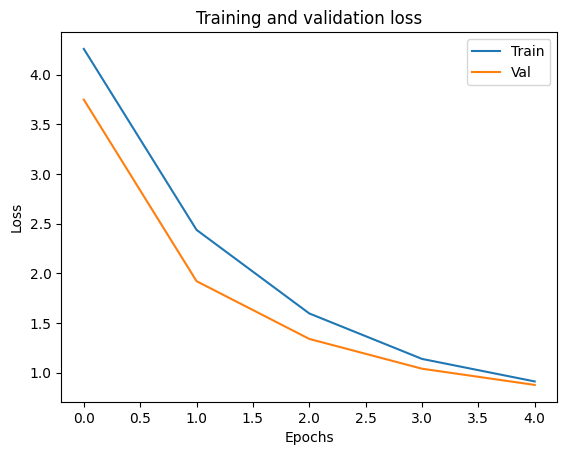

In [ ]:
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Val')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

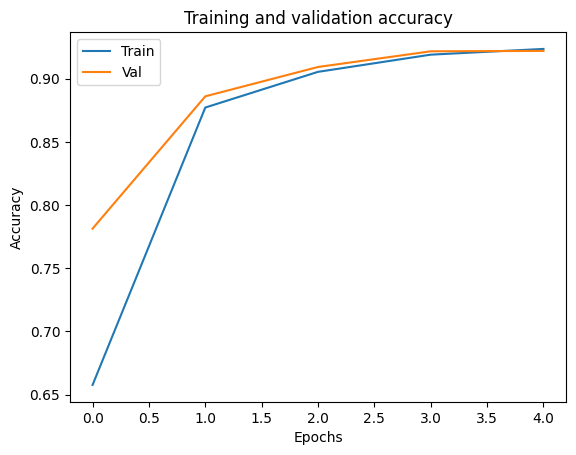

In [ ]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

 **Observaciones:**

Ambas pérdidas (Train y Val) disminuyen constantemente, lo que indica que el modelo está aprendiendo correctamente.

La pérdida de validación es ligeramente menor que la de entrenamiento en todo el proceso, lo que podría deberse a un buen ajuste del modelo o regularización efectiva.
La convergencia es rápida, alcanzando estabilidad después de solo 4 épocas.

**Conclusión:**
El modelo no muestra sobreajuste significativo y parece estar generalizando bien a los datos de validación.

In [ ]:
model_accuracy_PCA = model2.evaluate(X_train_PCA, Y_train)
print(f"Train Accuracy: {model_accuracy_PCA[1]}")


491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9516 - loss: 0.7312
Train Accuracy: 0.9438431262969971


In [ ]:
model_accuracy_PCA = model2.evaluate(X_test_PCA, Y_test)
print(f"Test Accuracy: {model_accuracy_PCA[1]}")

123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9275 - loss: 0.8503
Test Accuracy: 0.9264069199562073


123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


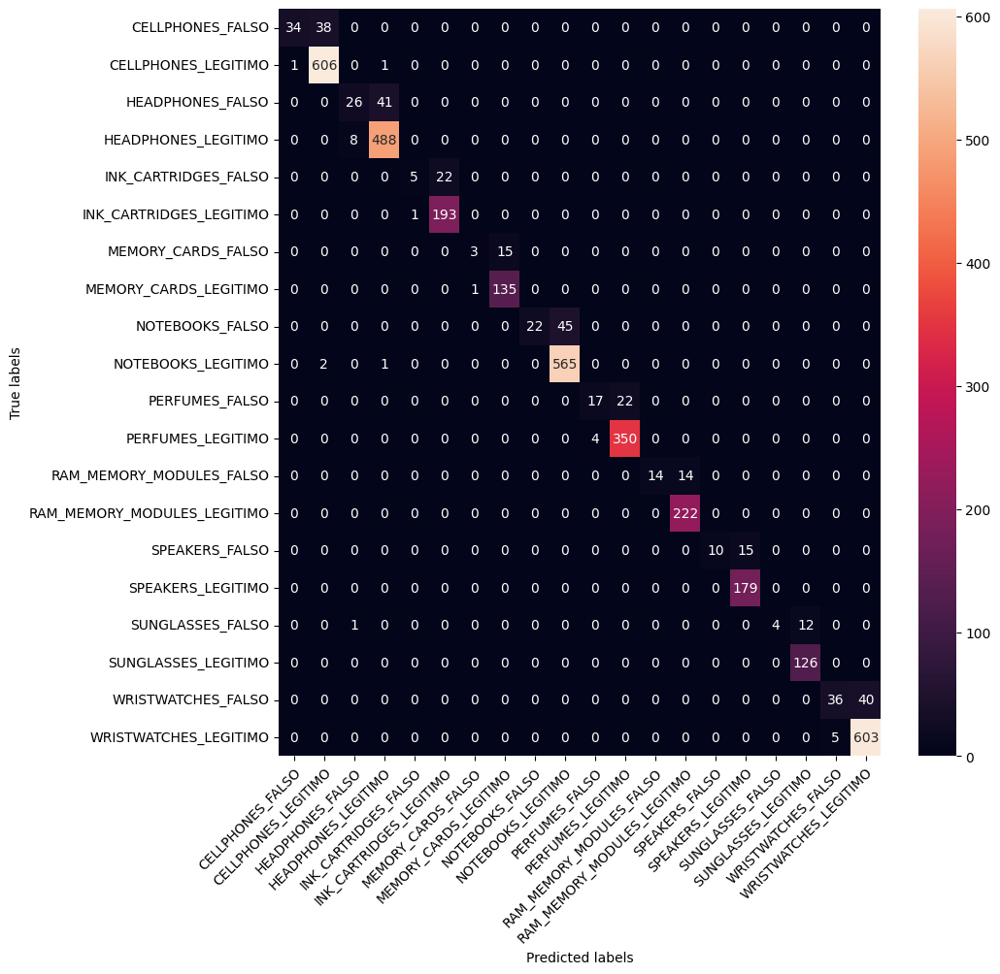

In [ ]:
# Matriz de Confusión Modelo con Regularización y DropOut
predictions_model2 = model2.predict(X_test_PCA)
predicted_classes_model2 = np.argmax(predictions_model2, axis=1)

predicted_labels_model2 = label_encoder.inverse_transform(predicted_classes_model2)
true_labels = label_encoder.inverse_transform(Y_test)

cm_model2 = confusion_matrix(true_labels, predicted_labels_model2)

label_mapping = {num_value: original_label for num_value, original_label in enumerate(unique_labels)}


fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm_model2, annot=True, fmt='d', ax=ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')

ax.set_xticklabels([label_mapping[num] for num in range(len(unique_labels))])
ax.set_yticklabels([label_mapping[num] for num in range(len(unique_labels))])

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor")
plt.show()


**Buena precisión en algunas clases:**

Categorías como CELLPHONES_LEGITIMO (606), NOTEBOOKS_LEGITIMO (565), y WRISTWATCHES_LEGITIMO (603) tienen altas predicciones correctas, indicando que el modelo reconoce bien estos productos legítimos.
Para los productos falsificados, HEADPHONES_FALSO (26 predicciones correctas de 67) y PERFUMES_FALSO (17 de 39) muestran buen desempeño.

**Errores en Clasificación:**

Algunos productos falsificados se confunden con sus versiones legítimas. Ejemplo:
CELLPHONES_FALSO → CELLPHONES_LEGITIMO (38 veces)
INK_CARTRIDGES_FALSO → INK_CARTRIDGES_LEGITIMO (24 veces)
NOTEBOOKS_FALSO → NOTEBOOKS_LEGITIMO (45 veces)
MEMORY_CARDS_FALSO → MEMORY_CARDS_LEGITIMO (15 veces)
Esto indica que el modelo aún tiene dificultades para separar productos legítimos y falsos en ciertas categorías.

**Clasificaciones Erróneas en Clases Distintas:**

Algunas falsificaciones se predicen incorrectamente en clases que no les corresponden, pero en pequeñas cantidades.
Por ejemplo, NOTEBOOKS_FALSO se clasifica como MEMORY_CARDS_FALSO (2 veces).

# Búsqueda de Hiperparámetros

In [ ]:
def build_model(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=128, step=32),
                    activation=hp.Choice('activation', ['relu', 'tanh']),
                    input_shape=(X_train_PCA.shape[1],)))
    model.add(Dropout(rate=hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(len(unique_labels), activation='softmax'))

    model.compile(optimizer=Adam(learning_rate=hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model



**Elección de Hiperpárametros para el entrenamiento de la red**

La función comienza definiendo un modelo secuencial de Keras, que es un modelo lineal de pilas de capas.

En primer lugar, agregar una capa densa: Se agrega una primera capa densa (totalmente conectada) al modelo. Los hiperparámetros de esta capa se configuran para buscar:

**units**: El número de neuronas en la capa, con un valor que puede variar entre 32 y 128 en incrementos de 32.

**activation**: La función de activación a usar, con opciones para buscar entre 'relu' y 'tanh'.

**capa de Dropout:** Luego, se agrega una capa de Dropout, que ayuda a prevenir el sobreajuste apagando aleatoriamente un porcentaje de las neuronas durante el entrenamiento:

**rate**: El ratio de Dropout a utilizar, con un valor que puede variar entre 0.0 y 0.5 en incrementos de 0.1.

**learning_rate**:Se utiliza el optimizador Adam, con una tasa de aprendizaje que se buscará entre 0.01, 0.001 y 0.0001.

Finalmente, se configura la salidad de la capa utilizando "softmax" debido a que nos estamos enfrentando a un problema de multiclase.


Se ha decidido utilizar Keras Turner debido a que este logra capturar las tendencias que pueden tener los datos en términos del subajuste o sobreajuste. Al igual que es una de las librerias que permiten realizar búsqueda de hiperpárametros de manera sencilla. Asimismo, las funciones de activación como "relu" o "tahn" suelen ser eficientes ya que facilitan el aprendizaje en capas posteriores a las de entrada.

Por otra parte incluimos DropOut debido a que esta función permite penalizar aquellos registros que pueden llevar al sobrejuste del modelo por lo cual se incluye en la búsqueda con un rango lo suficientemente amplio para este problema. Adicional a esta, el learning rate permite encontrar un buen equilibrio entre la rapidez del aprendizaje y la estabilidad del mismo.

No obstante, toda la búsqueda se hace prevaleciendo la métrica del accuracy como indicador del rendimiento del modelo.

In [ ]:
tuner = kt.RandomSearch(build_model,
                        objective='val_accuracy',
                        max_trials=20,
                        executions_per_trial=1,
                        directory='keras_tuner_dir',
                        project_name='keras_tuner_random_search',
                        overwrite=True)



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
tuner.search(X_train_PCA, Y_train, epochs=10, validation_split=0.2)


Trial 20 Complete [00h 00m 16s]
val_accuracy: 0.9191597700119019

Best val_accuracy So Far: 0.9239338040351868
Total elapsed time: 00h 05m 15s


In [ ]:
# Obtener los mejores hiperparámetros
best_hps = tuner.get_best_hyperparameters()[0]
print(f"Best units: {best_hps.get('units')}")
print(f"Best activation: {best_hps.get('activation')}")
print(f"Best dropout rate: {best_hps.get('dropout_rate')}")
print(f"Best learning rate: {best_hps.get('learning_rate')}")

# Obtenemos el mejor modelo
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()


Best units: 32
Best activation: tanh
Best dropout rate: 0.4
Best learning rate: 0.01


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 32)                  │         160,032 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 20)                  │             660 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 160,692 (627.70 KB)

 Trainable params: 160,692 (627.70 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
with tf.device('/device:GPU:0'):
  history3 = best_model.fit(X_train_PCA, Y_train, validation_split=0.2, epochs=50, batch_size=32, verbose=2, callbacks=[early_stopping_pca])


Epoch 1/50
393/393 - 4s - 9ms/step - accuracy: 0.9292 - loss: 0.2366 - val_accuracy: 0.9227 - val_loss: 0.2814
Epoch 2/50
393/393 - 1s - 3ms/step - accuracy: 0.9441 - loss: 0.1870 - val_accuracy: 0.9141 - val_loss: 0.2938
Epoch 3/50
393/393 - 1s - 3ms/step - accuracy: 0.9487 - loss: 0.1623 - val_accuracy: 0.9211 - val_loss: 0.3279
Epoch 4/50
393/393 - 1s - 3ms/step - accuracy: 0.9541 - loss: 0.1473 - val_accuracy: 0.9109 - val_loss: 0.3305
Epoch 5/50
393/393 - 1s - 3ms/step - accuracy: 0.9557 - loss: 0.1394 - val_accuracy: 0.9093 - val_loss: 0.3489
Epoch 6/50
393/393 - 1s - 3ms/step - accuracy: 0.9594 - loss: 0.1285 - val_accuracy: 0.9169 - val_loss: 0.3941
Epoch 7/50
393/393 - 1s - 3ms/step - accuracy: 0.9581 - loss: 0.1275 - val_accuracy: 0.9163 - val_loss: 0.3833
Epoch 8/50
393/393 - 1s - 3ms/step - accuracy: 0.9630 - loss: 0.1184 - val_accuracy: 0.9102 - val_loss: 0.3928
Epoch 9/50
393/393 - 1s - 3ms/step - accuracy: 0.9608 - loss: 0.1169 - val_accuracy: 0.9115 - val_loss: 0.4100
E

In [ ]:
# Evaluar el modelo en el conjunto de entrenamiento
train_loss, train_accuracy = best_model.evaluate(X_train_PCA, Y_train)
print(f"Train Loss: {train_loss}")
print(f"Train Accuracy: {train_accuracy}")


491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9587 - loss: 0.1315
Train Loss: 0.15990297496318817
Train Accuracy: 0.9513561725616455


In [ ]:
# Evaluar el modelo en el conjunto de prueba
test_loss, test_accuracy = best_model.evaluate(X_test_PCA, Y_test)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


123/123 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9250 - loss: 0.2598
Test Loss: 0.28360459208488464
Test Accuracy: 0.924369752407074


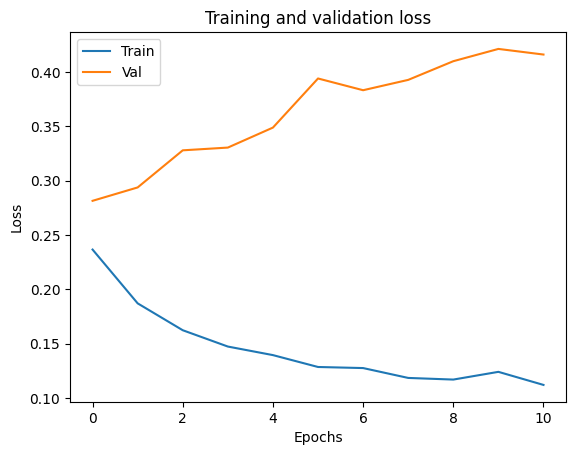

In [ ]:
plt.plot(history3.history['loss'], label='Train')
plt.plot(history3.history['val_loss'], label='Val')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

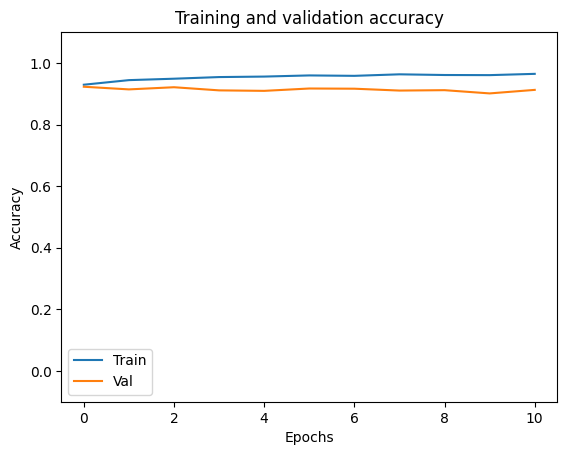

In [ ]:
plt.plot(history3.history['accuracy'], label='Train')
plt.plot(history3.history['val_accuracy'], label='Val')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylim(-0.1,1.1)
plt.ylabel('Accuracy')
plt.legend()
plt.show()

123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


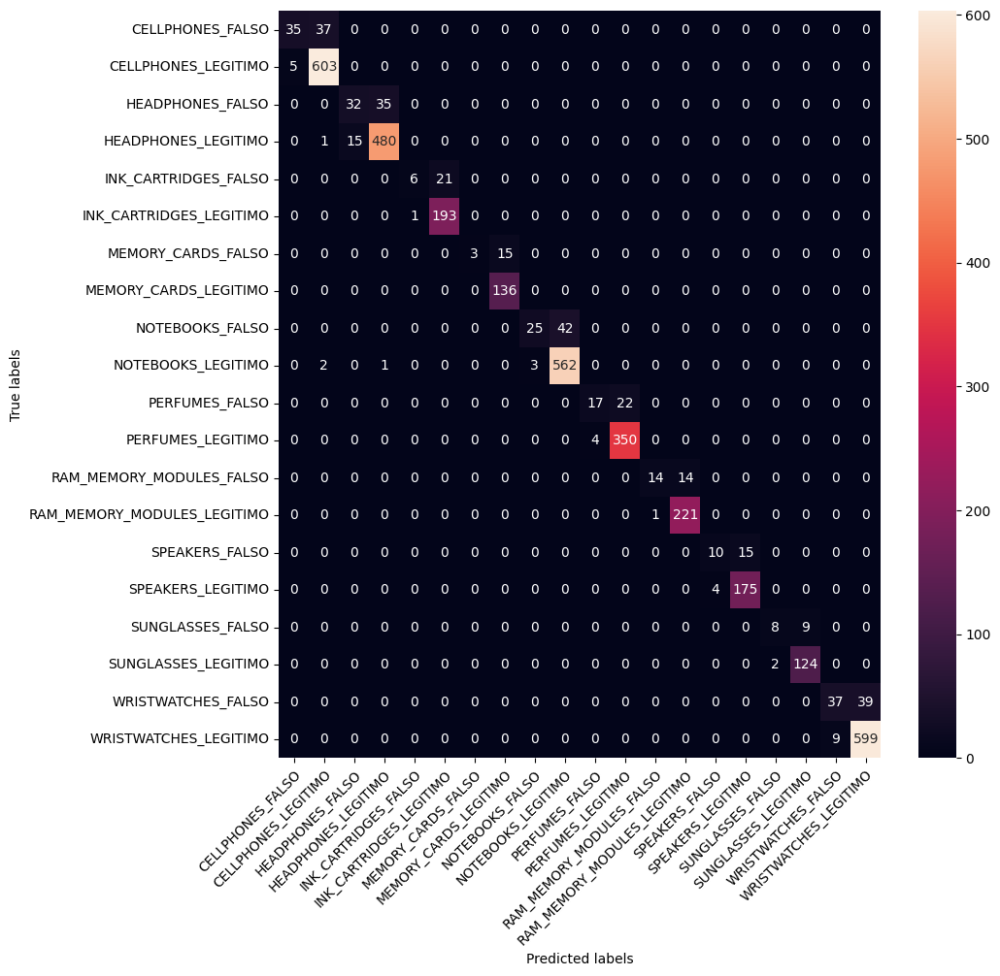

In [ ]:
#Matriz de confusión Modelo Resultante
predictions_best_model = best_model.predict(X_test_PCA)
predicted_classes_best_model = np.argmax(predictions_best_model, axis=1)

predicted_labels_best_model = label_encoder.inverse_transform(predicted_classes_best_model)
true_labels = label_encoder.inverse_transform(Y_test)

cm_best_model = confusion_matrix(true_labels, predicted_labels_best_model)

label_mapping = {num_value: original_label for num_value, original_label in enumerate(unique_labels)}


fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(cm_best_model, annot=True, fmt='d', ax=ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')

ax.set_xticklabels([label_mapping[num] for num in range(len(unique_labels))])
ax.set_yticklabels([label_mapping[num] for num in range(len(unique_labels))])

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.setp(ax.get_yticklabels(), rotation=0, ha="right", rotation_mode="anchor")
plt.show()

**Precisión general del modelo**

La diagonal principal muestra las predicciones correctas para cada categoría. En la mayoría de los casos, el modelo predice correctamente las clases de productos legítimos y falsificados.
Las categorías con mayor cantidad de instancias, como CELL PHONES LEGÍTIMO (603 correctas) y HEADPHONES LEGÍTIMO (480 correctas), presentan una alta precisión.
Errores comunes del modelo

Se observa una confusión entre productos falsificados y legítimos dentro de la misma categoría.
- CELL PHONES FALSO → CELL PHONES LEGÍTIMO (37 veces)
- HEADPHONES FALSO → HEADPHONES LEGÍTIMO (35 veces)
- NOTEBOOKS FALSO → NOTEBOOKS LEGÍTIMO (25 veces)

Esto sugiere que, en algunos casos, el modelo no puede diferenciar claramente entre productos falsificados y legítimos en ciertas categorías, lo que puede deberse a similitudes en las descripciones o precios.


## Conclusiones Generales

## **Conclusiones Generales**

Tras el análisis realizado con técnicas de **clusterización** y la aplicación de un modelo basado en **TF-IDF y redes neuronales**, podemos extraer una serie de conclusiones en términos de ventajas y oportunidades de mejora en ambos enfoques.

---

## ** Clusterización: Ventajas y Oportunidades de Mejora**

### **Ventajas de la Clusterización**

1. **Capacidad de Agrupación Natural**  
   - Se lograron identificar patrones en los productos a partir de sus características de precio y descripción, lo que permitió agrupar productos legítimos y falsificados en categorías diferenciadas.  
   - En el análisis con **t-SNE**, los productos falsificados y legítimos de algunas categorías lograron separarse claramente, lo que indica que existen diferencias intrínsecas que pueden ser explotadas para mejorar la detección automática.  

2. **Identificación de Categorías con Alta Confusión**  
   - La clusterización reveló que ciertas categorías, como **cellphones, perfumes y memory cards**, presentan solapamientos entre productos falsificados y legítimos, lo que sugiere que en estas áreas se requiere una mejor diferenciación de características.  

3. **Diferenciación en Espacios No Lineales**  
   - Se observó que al aplicar **t-SNE** (una reducción de dimensionalidad no lineal), las separaciones fueron más evidentes que con métodos como PCA o K-Means. Esto confirma que los datos no siguen una distribución lineal simple, por lo que modelos más complejos pueden mejorar la segmentación.  

---

### **Oportunidades de Mejora en la Clusterización**

1. **Mejor Representación de Características**  
   - Incorporar **metadatos adicionales** como la **marca del producto**, imágenes o características de la publicación podría mejorar la diferenciación entre productos legítimos y falsificados.  

2. **Evaluación de Algoritmos Más Avanzados**  
   - Se podrían probar métodos más sofisticados como **DBSCAN** o **HDBSCAN**, que permiten manejar mejor la dispersión y los clusters con diferente densidad.  

3. **Optimización del Número de Clusters**  
   - El número de clusters puede optimizarse mejor con técnicas como el **coeficiente de silueta** o el método del **codo** para garantizar una separación más efectiva entre clases.  

---

## ** Modelo TF-IDF con Redes Neuronales: Ventajas y Oportunidades de Mejora**

###  **Ventajas del Modelo TF-IDF**

1. **Buena Generalización en Varias Categorías**  
   - El modelo basado en **TF-IDF y redes neuronales** mostró una buena capacidad de generalización en múltiples categorías, alcanzando una precisión alta en la detección de productos falsificados dentro de algunas de ellas.  

2. **Escalabilidad y Aplicabilidad a Nuevos Datos**  
   - TF-IDF es una técnica eficiente y escalable que puede adaptarse fácilmente a grandes volúmenes de datos sin la necesidad de etiquetado manual constante.  

3. **Resultados Consistentes en Categorías con Diferencias Claras**  
   - Categorías como **cellphones y notebooks** presentaron una diferenciación clara entre productos legítimos y falsificados, lo que demuestra que el modelo puede ser útil en mercados donde las descripciones tienden a diferenciarse entre productos originales y réplicas.  

---

###  **Oportunidades de Mejora en el Modelo TF-IDF**

1. **Confusión en Algunas Categorías**  
   - Se evidenció confusión en ciertas categorías como **memory cards, ink cartridges y perfumes**, donde productos falsificados fueron clasificados como legítimos y viceversa. Esto sugiere que el **texto de la descripción y el precio no son suficientes** para la identificación de falsificaciones en estos casos.  

2. **Limitaciones de TF-IDF con Semántica Compleja**  
   - TF-IDF no captura la semántica de los textos, por lo que un **modelo basado en embeddings de palabras** (como Word2Vec o BERT) podría mejorar la comprensión del significado en descripciones de productos y ayudar a diferenciar entre términos utilizados en falsificaciones y productos legítimos.  

3. **Optimización del Modelo de Clasificación**  
   - Se podrían probar diferentes arquitecturas de redes neuronales, como **LSTMs o Transformers**, que han demostrado ser más efectivos en la clasificación de textos con mayor contexto.  

4. **Incorporación de Más Datos en el Entrenamiento**  
   - El modelo podría beneficiarse de un **aumento de datos** con ejemplos adicionales, en especial en las categorías donde hubo más confusión, para mejorar la capacidad del modelo de diferenciar correctamente entre clases.  

